In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import statsmodels.api as sm
from linearmodels import PanelOLS

import warnings
warnings.filterwarnings('ignore')

In [2]:
# index_col = [0,2] will select  countrycode as the primary index and year as 
# the secondary index
data = pd.read_csv('fraserDataWithRGDPPC.csv',
                  index_col = ['ISO_Code_3','Year'],
                  parse_dates = True).rename(columns = {'Summary':'EFW'})

In [3]:
data

Countries       EFW  Size of Government  \
ISO_Code_3 Year                                                 
AGO        1970-01-01    Angola       NaN                 NaN   
           1971-01-01       NaN       NaN                 NaN   
           1972-01-01       NaN       NaN                 NaN   
           1973-01-01       NaN       NaN                 NaN   
           1974-01-01       NaN       NaN                 NaN   
...                         ...       ...                 ...   
ZWE        2014-01-01  Zimbabwe  5.999147            6.771807   
           2015-01-01  Zimbabwe  6.449595            6.964753   
           2016-01-01  Zimbabwe  6.121996            5.332597   
           2017-01-01  Zimbabwe  5.599886            4.699843   
           2018-01-01  Zimbabwe  5.876298            5.170946   

                       Legal System and Property Rights  Sound Money  \
ISO_Code_3 Year                                                        
AGO        1970-01-01                               NaN          NaN   
           1971-01-01                               NaN          NaN   
           1972-01-01                               NaN          NaN   
           1973-01-01                               NaN          NaN   
           1974-01-01                               NaN          NaN   
...                                                 ...          ...   
ZWE        2014-01-01                          3.930143     7.664303   
           2015-01-01                          4.108142     7.859669   
           2016-01-01                          4.056407     8.086016   
           2017-01-01                          4.071445     7.983888   
           2018-01-01                          4.041897     7.312324   

                       Freedom to Trade Internationally  Regulation  \
ISO_Code_3 Year                                                       
AGO        1970-01-01                               NaN         NaN   
           1971-01-01                               NaN         NaN   
           1972-01-01                               NaN         NaN   
           1973-01-01                               NaN         NaN   
           1974-01-01                               NaN         NaN   
...                                                 ...         ...   
ZWE        2014-01-01                          6.398692    5.039824   
           2015-01-01                          6.509231    6.555970   
           2016-01-01                          6.404937    6.520805   
           2017-01-01                          4.503965    6.399757   
           2018-01-01                          6.396649    6.303135   

                       RGDP Per Capita  
ISO_Code_3 Year                         
AGO        1970-01-01              NaN  
           1971-01-01              NaN  
           1972-01-01              NaN  
           1973-01-01              NaN  
           1974-01-01              NaN  
...                                ...  
ZWE        2014-01-01         0.215452  
           2015-01-01         0.106888  
           2016-01-01         0.012463  
           2017-01-01        -0.013579  
           2018-01-01         0.004606  

[8085 rows x 8 columns]

In [4]:
data.index[0]

('AGO', Timestamp('1970-01-01 00:00:00'))

## Isolate each individual that comprises the multiindex

In [5]:
countries = data.index.get_level_values('ISO_Code_3').unique()
countries

Index(['AGO', 'ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BDI', 'BEL',
       ...
       'UGA', 'UKR', 'URY', 'USA', 'VEN', 'VNM', 'YEM', 'ZAF', 'ZMB', 'ZWE'],
      dtype='object', name='ISO_Code_3', length=165)

In [6]:
years = data.index.get_level_values('Year').unique()
years

DatetimeIndex(['1970-01-01', '1971-01-01', '1972-01-01', '1973-01-01',
               '1974-01-01', '1975-01-01', '1976-01-01', '1977-01-01',
               '1978-01-01', '1979-01-01', '1980-01-01', '1981-01-01',
               '1982-01-01', '1983-01-01', '1984-01-01', '1985-01-01',
               '1986-01-01', '1987-01-01', '1988-01-01', '1989-01-01',
               '1990-01-01', '1991-01-01', '1992-01-01', '1993-01-01',
               '1994-01-01', '1995-01-01', '1996-01-01', '1997-01-01',
               '1998-01-01', '1999-01-01', '2000-01-01', '2001-01-01',
               '2002-01-01', '2003-01-01', '2004-01-01', '2005-01-01',
               '2006-01-01', '2007-01-01', '2008-01-01', '2009-01-01',
               '2010-01-01', '2011-01-01', '2012-01-01', '2013-01-01',
               '2014-01-01', '2015-01-01', '2016-01-01', '2017-01-01',
               '2018-01-01'],
              dtype='datetime64[ns]', name='Year', freq=None)

In [7]:
def create_indicator_variable(data, indicator_name, index_name, target_index_list):
    
    # Set the initial value of the indicator variable to 0 for all rows in the DataFrame
    data[indicator_name] = 0
    
    # Set the indicator variable to 1 for all rows where the value of the specified index column
    # matches one of the values in the target_index_list
    data[indicator_name][data.index.get_level_values(index_name).isin(target_index_list)] = 1
    

    # for index in target_index_list:
    #     data.loc[data.index.get_level_values(index_name) == index, [indicator_name]] = 1

# Set the value of index_name to the name of the first index column in the DataFrame
index_name = data.index.names[0]

# Set the value of indicator_name to 'North America'
indicator_name = 'North America'

# Create a list of country codes for countries in North America
countries_in_north_america = [
    'BHS', 'BRB', 'BLZ', 'CAN', 'CRI', 'DOM', 'SLV',
    'GTM', 'HTI', 'HND', 'JAM', 'MEX', 'NIC', 'PAN',
    'TTO', 'USA']

# Call the function to set the value of the 'North America' indicator variable
# to 1 for all rows where the first index column matches a country code in the countries_in_north_america list
create_indicator_variable(data=data,
                         indicator_name=indicator_name,
                         index_name=index_name,
                         target_index_list=countries_in_north_america)

# Select all rows from the DataFrame where the value of the first index column is 'USA'
data.loc['USA']

,Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,RGDP Per Capita,North America
Year,,,,,,,,,
1970-01-01,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,NaN,1
1971-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1972-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1973-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1974-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1975-01-01,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,0.080100,1
1976-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1977-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1978-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


## Plotting Indicator Variables

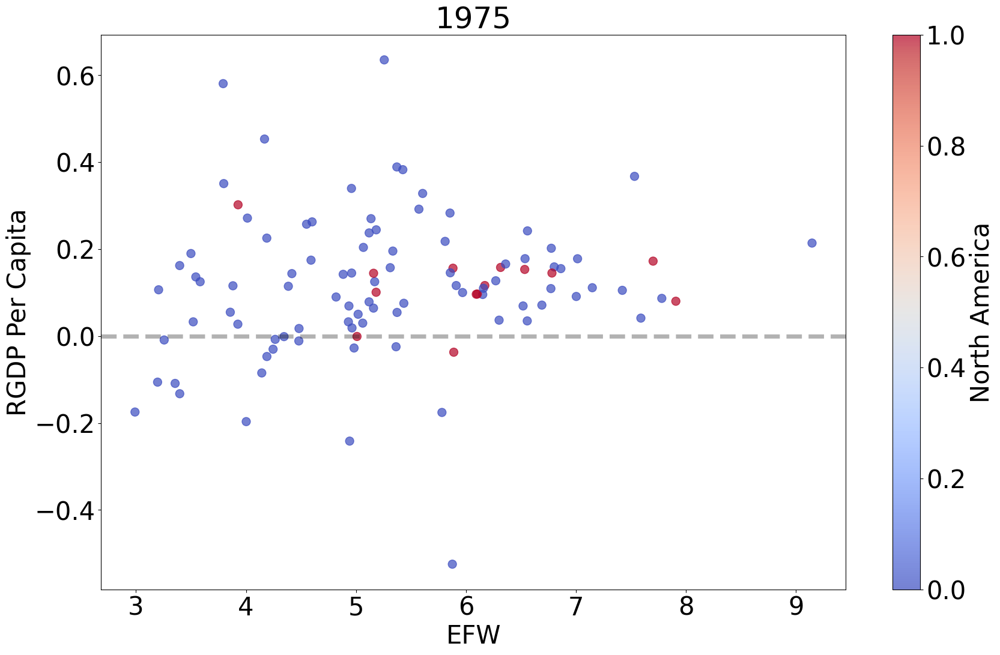

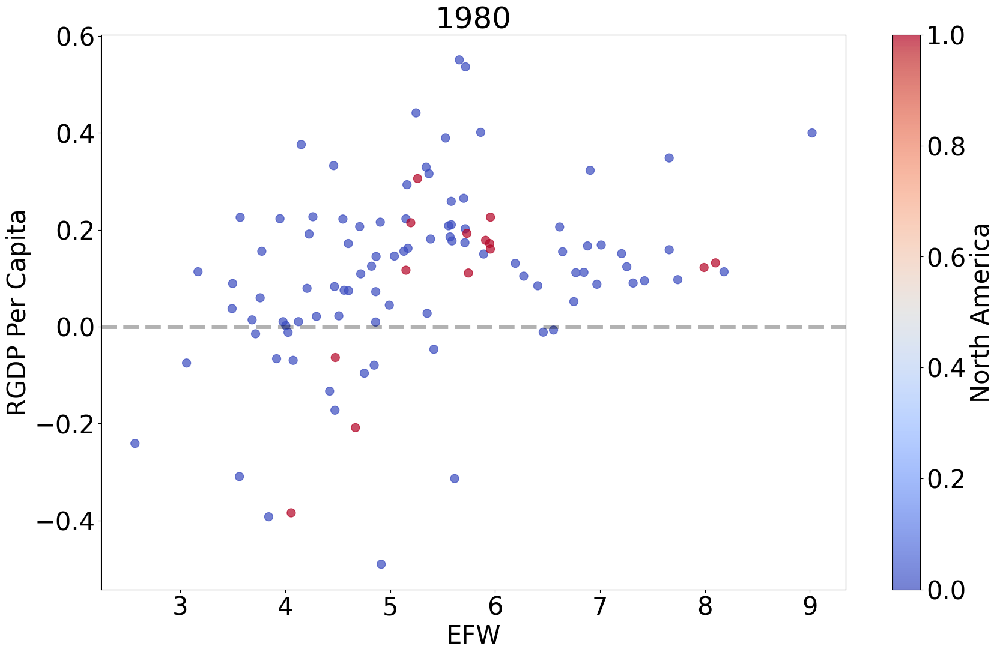

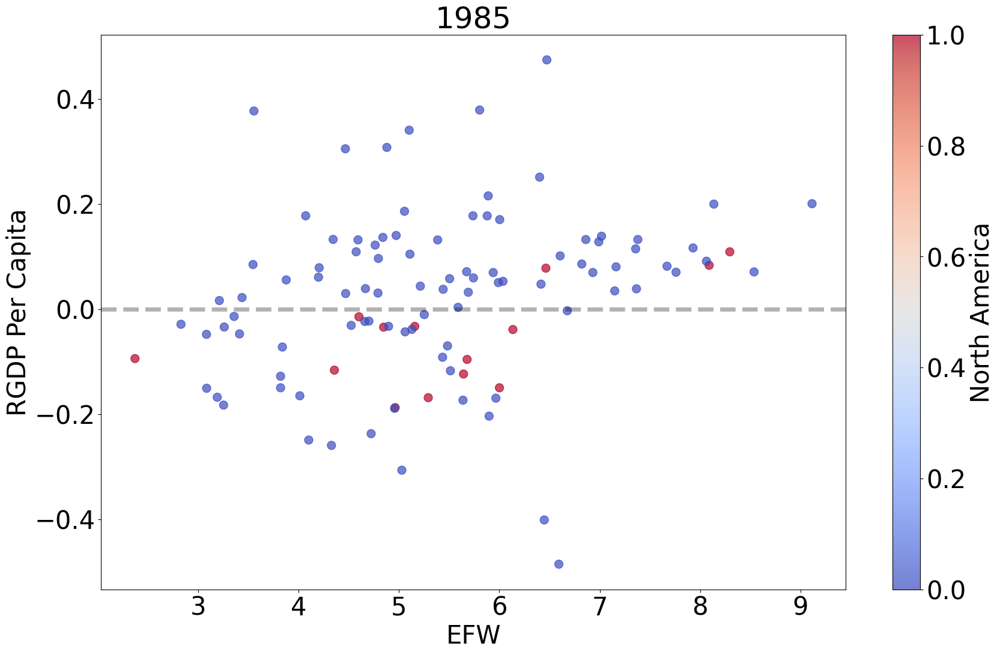

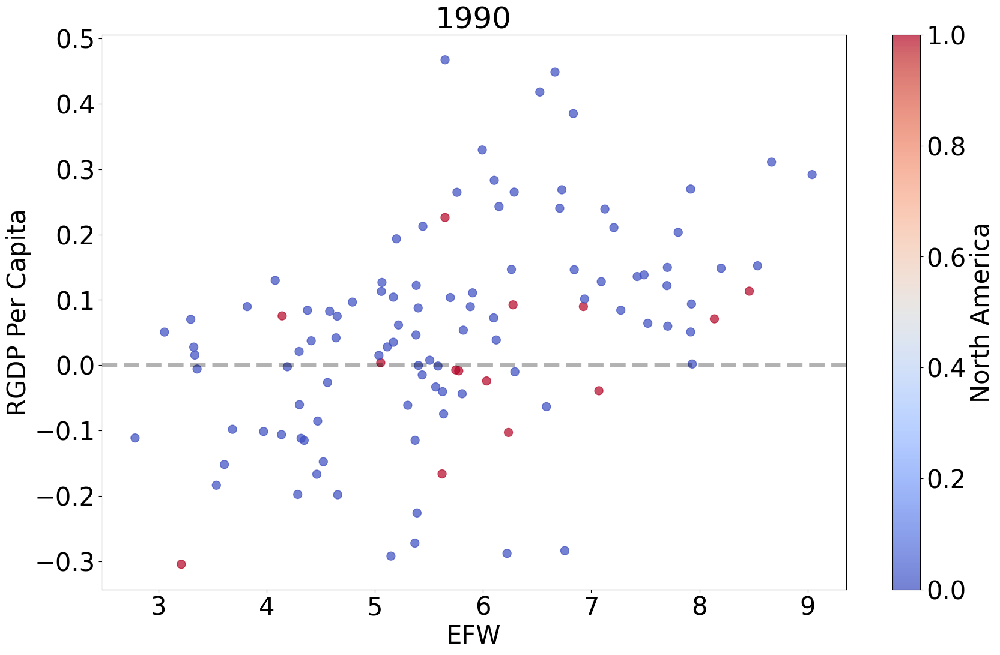

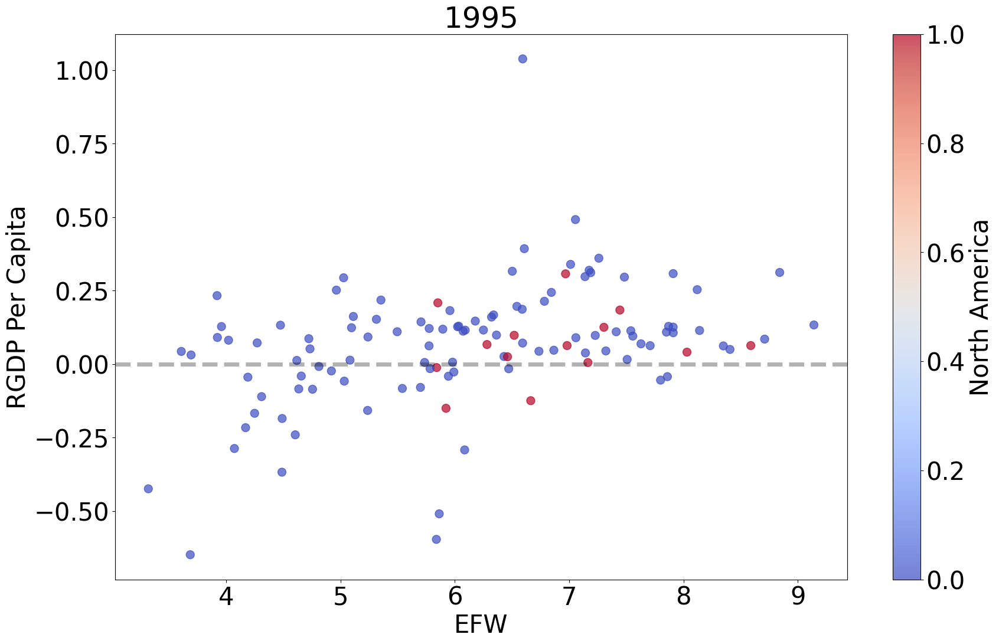

...

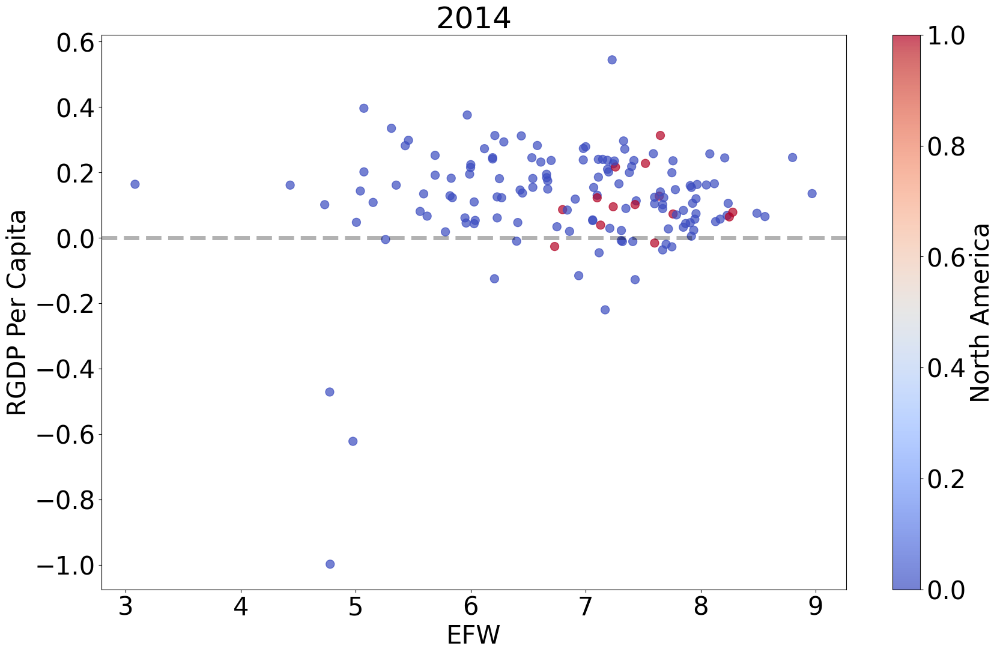

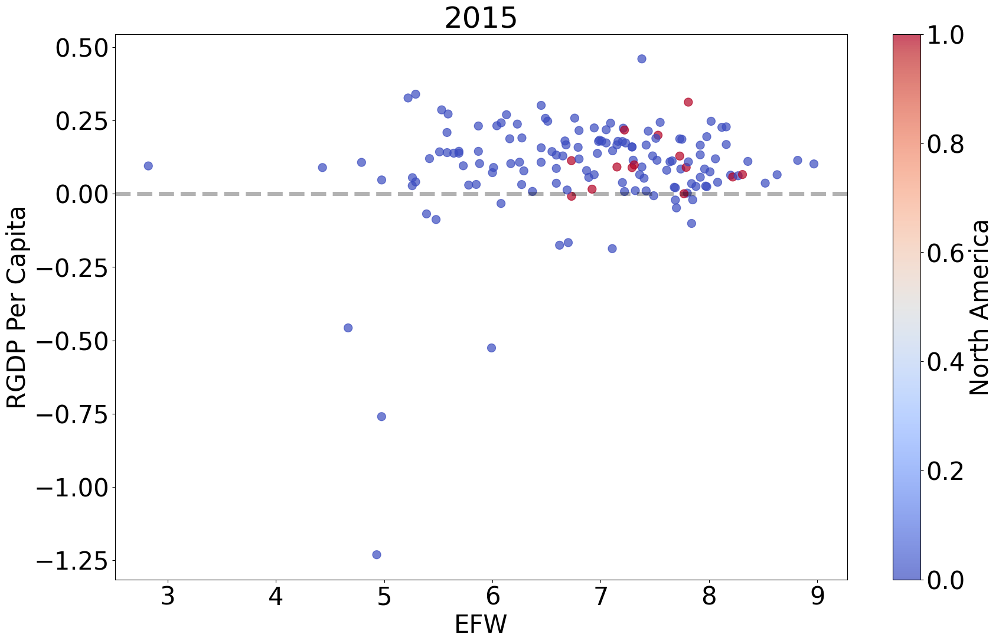

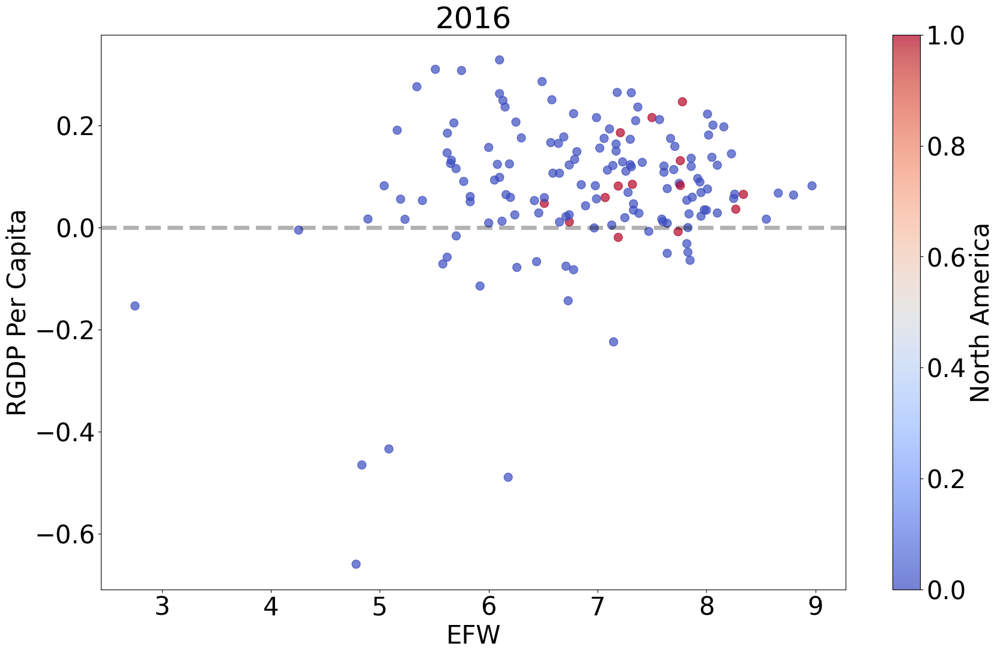

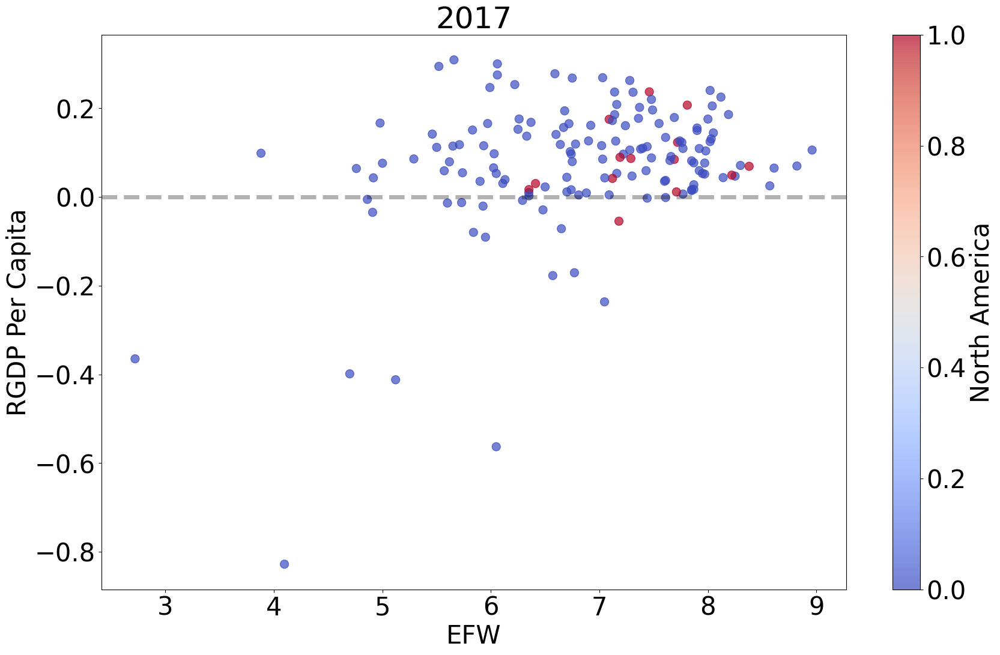

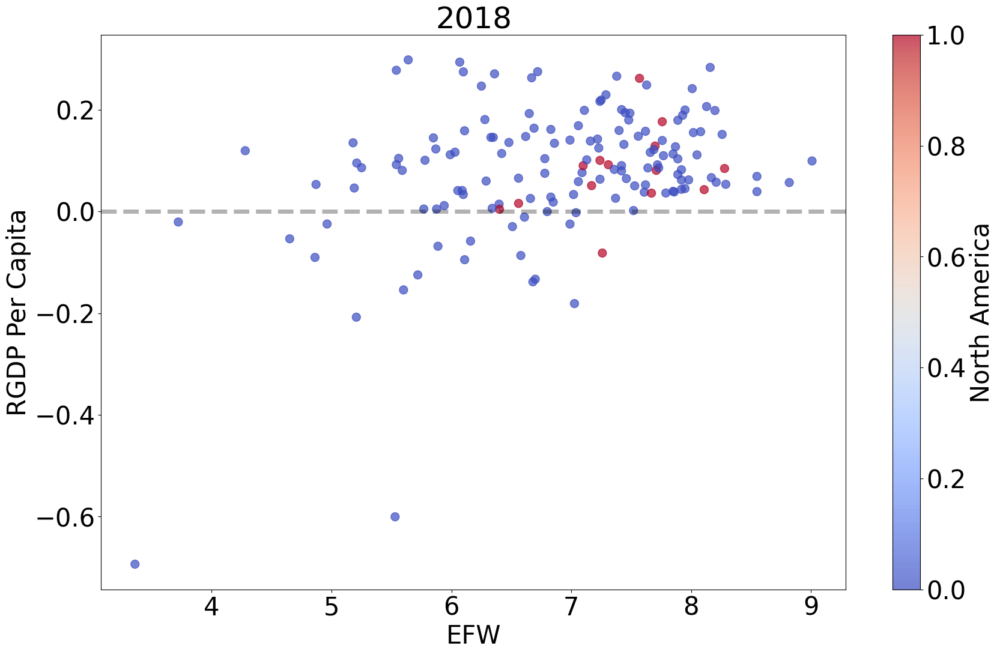

In [8]:
# Set the font size for all Matplotlib plots to 30
plt.rcParams.update({'font.size':30})

# Get a list of unique years from the dataset where the 'RGDP Per Capita' column is not null
years = data.dropna(subset = ['RGDP Per Capita']).index.get_level_values('Year').unique()

# Loop through each year in the years list
for year in years:

    # Get the subset of data for the current year
    plot_data = data[data.index.get_level_values('Year') == year]
    
    # Create a new Matplotlib figure and axis object
    fig, ax = plt.subplots(figsize = (20,12))
    
    # Create a scatter plot of 'EFW' against 'RGDP Per Capita' with points colored by the value of the 'North America' indicator variable
    plot_data.plot.scatter(x = 'EFW',
                          y = 'RGDP Per Capita',
                          c = 'North America',
                          cmap = 'coolwarm', 
                           s = 100,
                           alpha = .7,
                           ax = ax)
    
    # Set the title of the plot to the current year
    ax.set_title(str(year)[:4])
    
    # Add a horizontal dashed line at y=0 to the plot
    ax.axhline(0, ls = '--', color = 'k', alpha = .3, linewidth = 5)


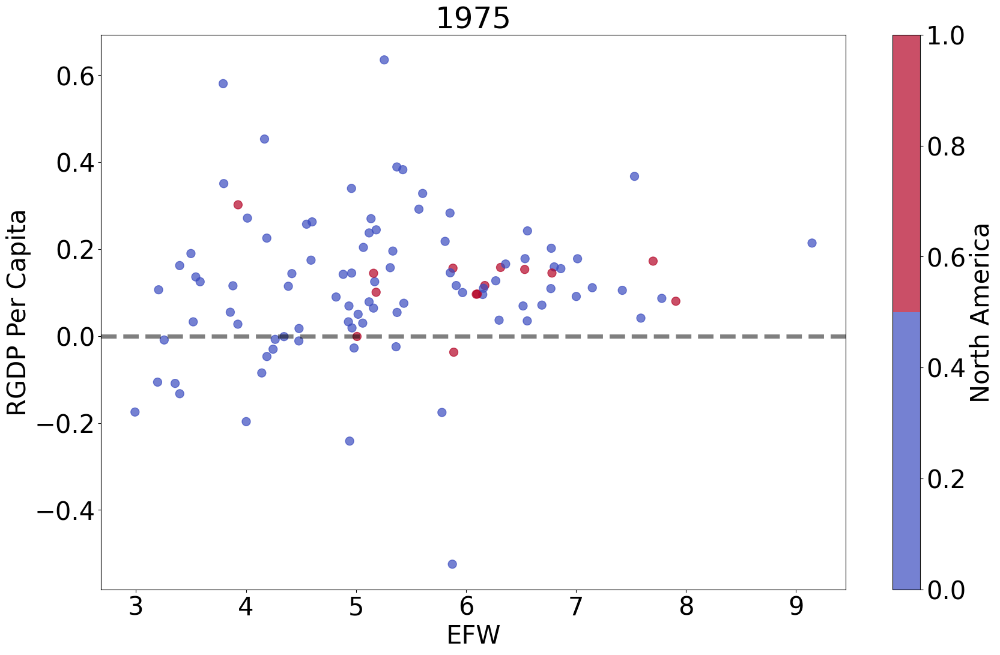

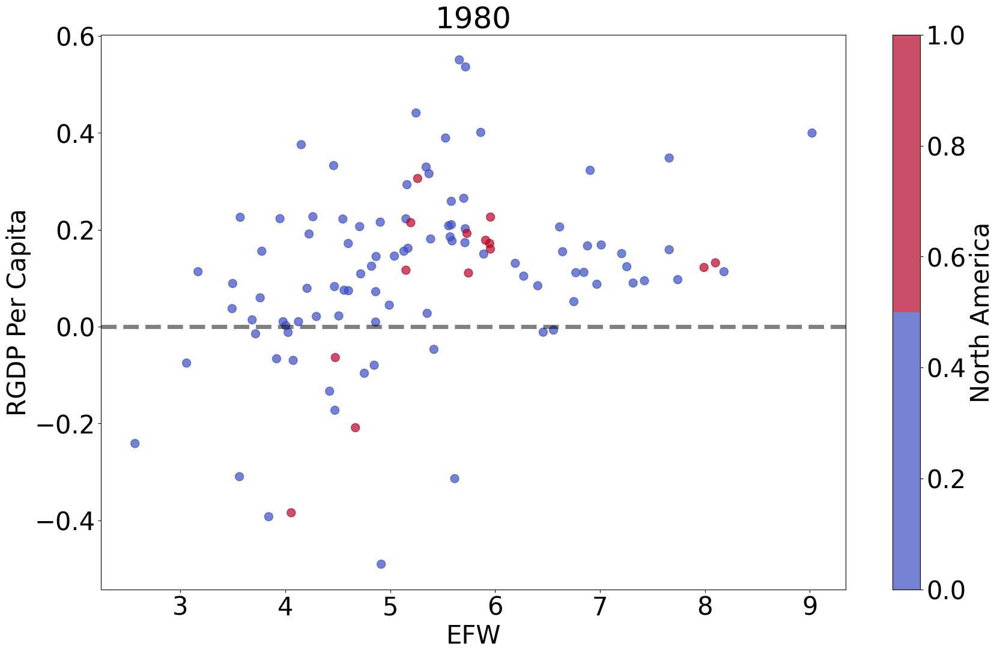

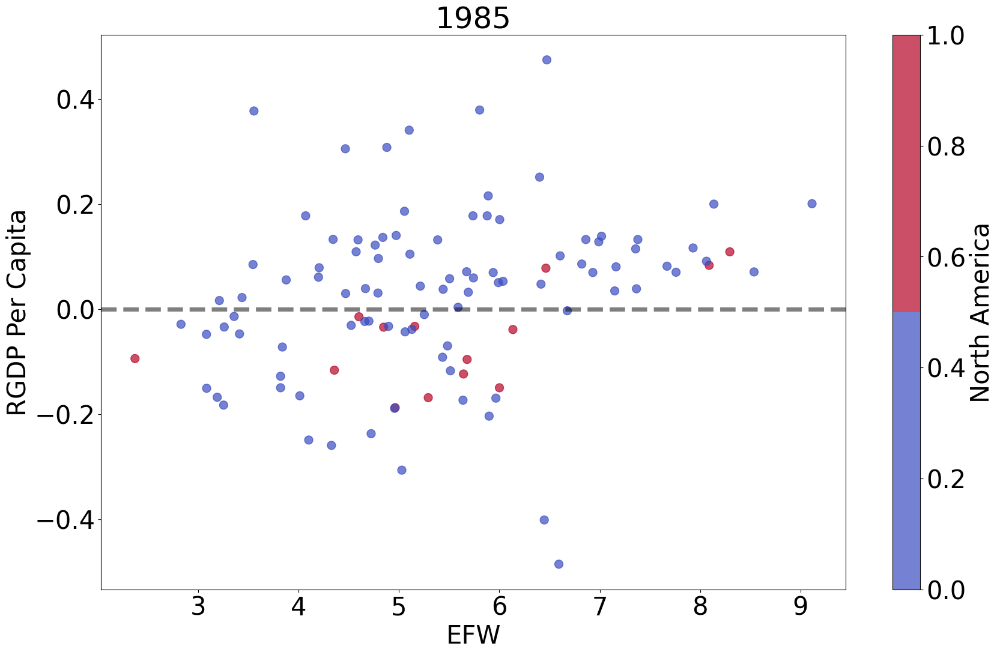

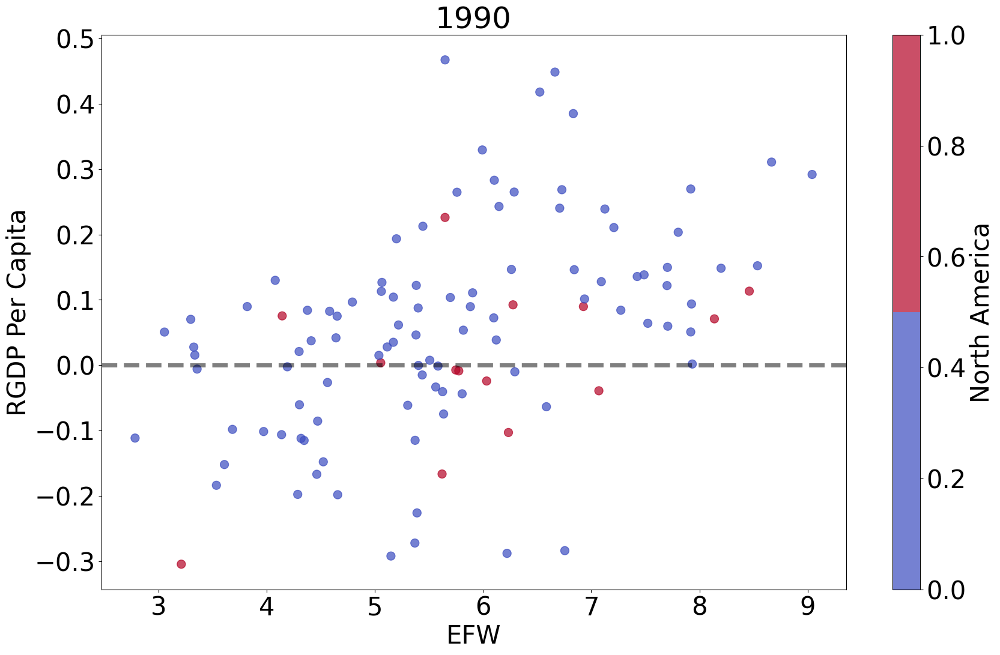

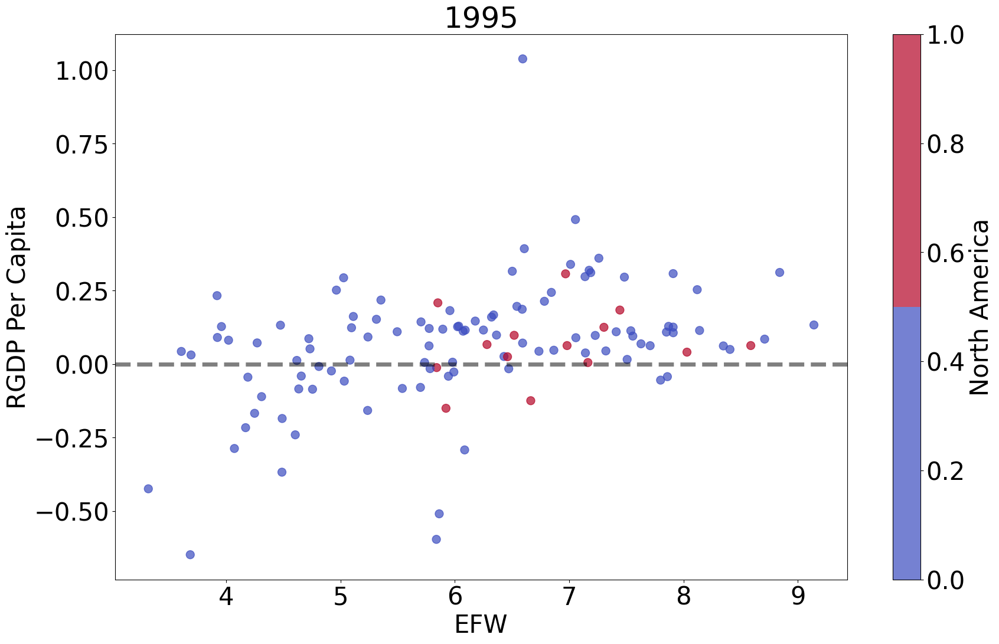

...

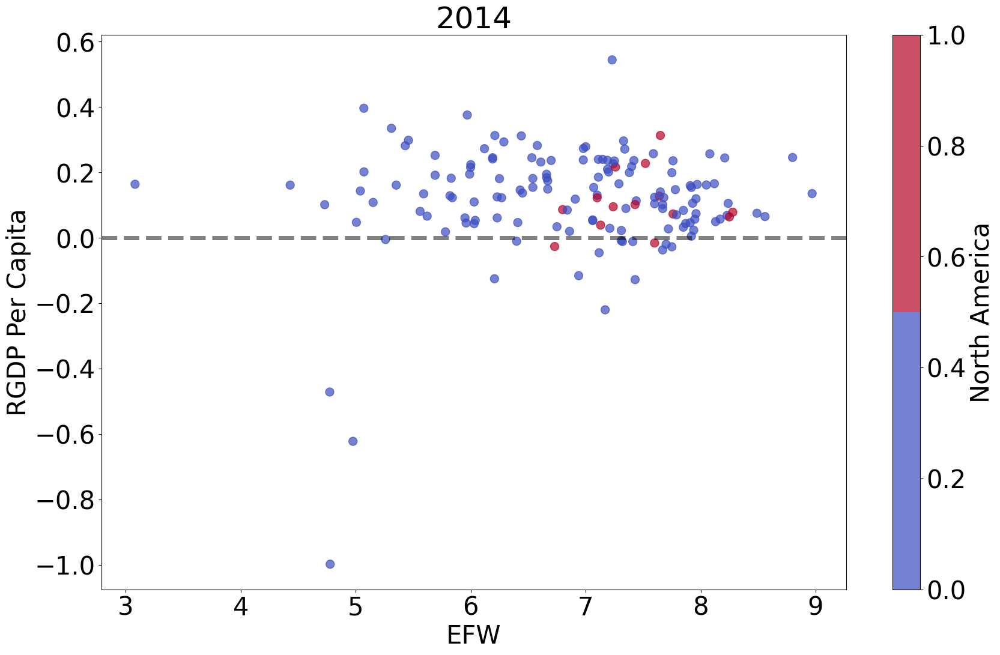

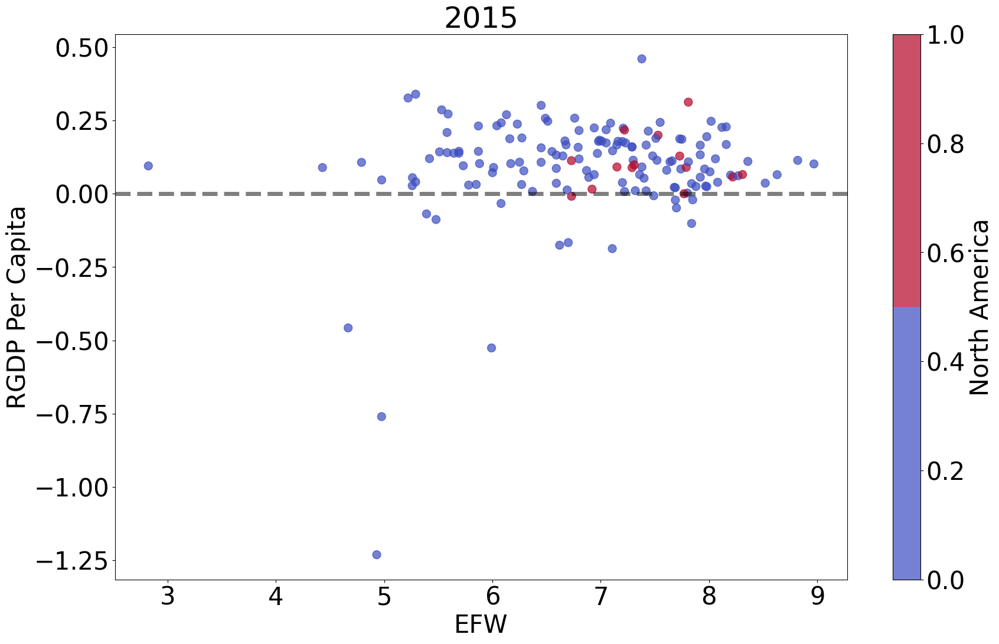

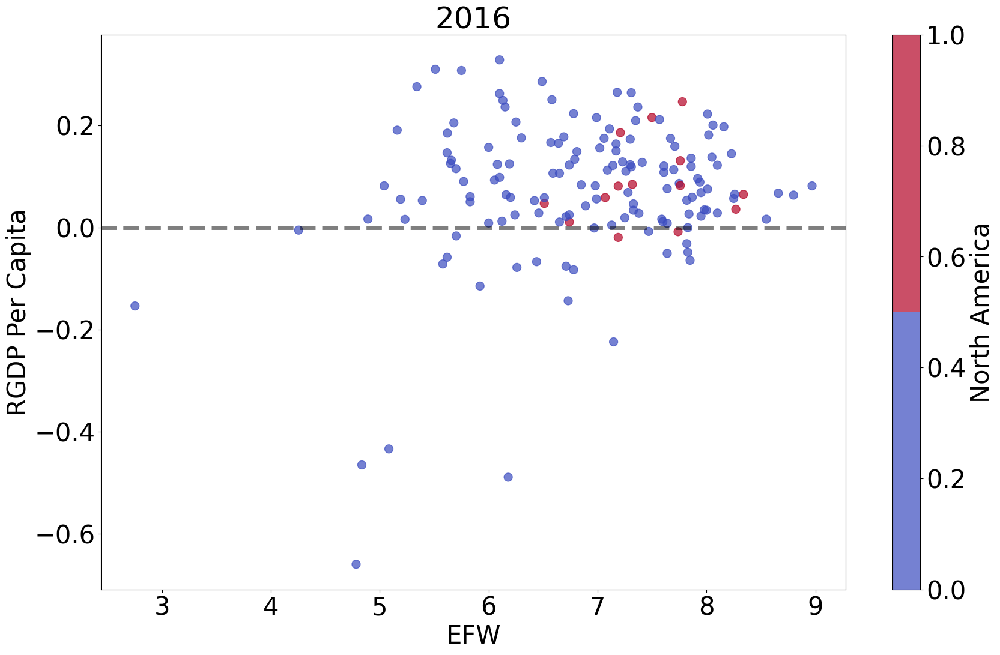

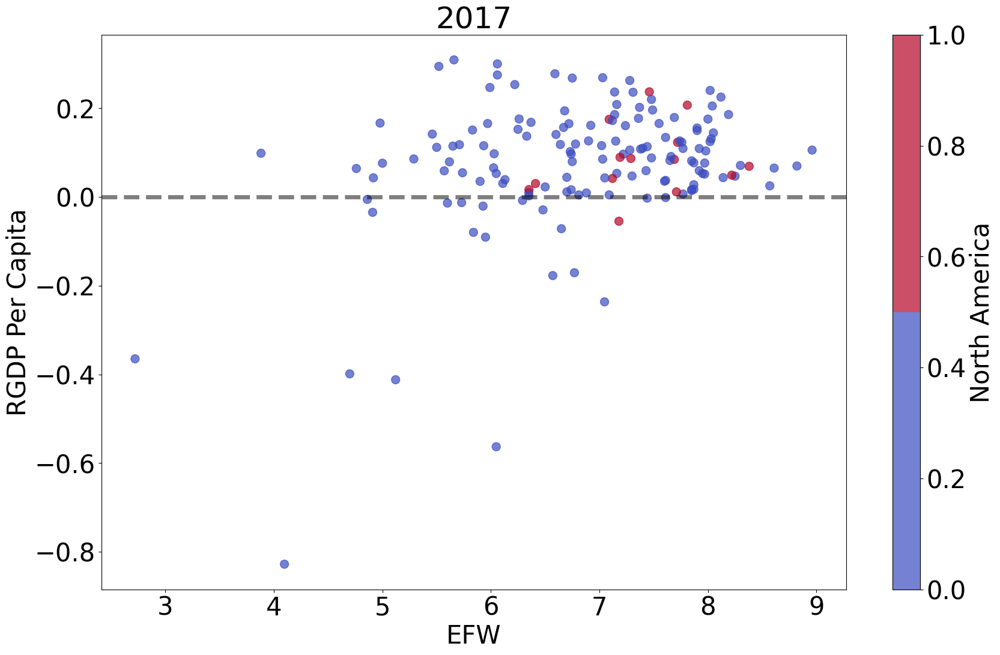

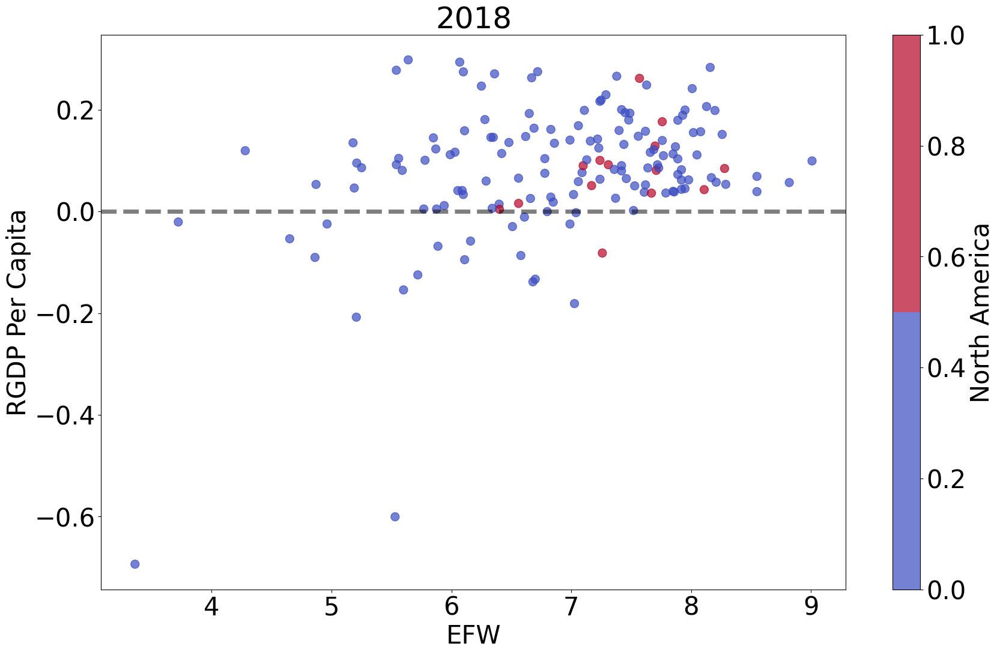

In [9]:
# Set font size for plots
plt.rcParams.update({'font.size': 30})

# Get unique years with non-null RGDP Per Capita values
years = data.dropna(subset=['RGDP Per Capita']).index.get_level_values('Year').unique()

# Set up color mapping for North America indicator variable
norm = cm.colors.Normalize()
cmap = cm.get_cmap('coolwarm', 2)

# Loop through each year and create scatter plot
for year in years:
    # Filter data by year
    plot_data = data[data.index.get_level_values('Year') == year]
    
    # Create plot
    fig, ax = plt.subplots(figsize=(20, 12))
    plot_data.plot.scatter(x='EFW',
                           y='RGDP Per Capita',
                           c='North America',
                           cmap=cmap,
                           norm=norm,
                           s=100,
                           alpha=.7,
                           ax=ax)
    
    # Set plot title to the year
    ax.set_title(str(year)[:4])
    
    # Add horizontal line at y=0
    ax.axhline(0, ls='--', color='k', alpha=.5, linewidth=5)

In [10]:
# Create a new column for the n-tile quantile
n = 5
quantile_var = 'RGDP Per Capita'
quantile_name = quantile_var + ' ' + str(n) + '-tile'
data[quantile_name] = np.nan

In [11]:
def create_quantile(n, data, year, quantile_var, quantile_name):
    # Create a boolean index that identifies countries for a given year
    year_index = data.index.get_level_values('Year') == year
    
    # Create a dictionary with quantile values for each quintile
    quantile_values_dict = {
        i:data[year_index][quantile_var].quantile(i/n) for i in range(1, n+1)}
    
    # Iterate over each country for a given year
    for index in data[year_index].index:
        # Identify the value of the variable of interest for the current country
        val = data.loc[index][quantile_var]
        
        # Determine which quintile the value falls into, and assign the corresponding quantile value
        for i in range(1, n + 1):
            if val <= quantile_values_dict[i]:
                data.loc[index,quantile_name] = int((n + 1) - i)
                break
        else:
            continue


# Iterate over each year in the dataset, and create quantile variables for each year
for year in years:
    create_quantile(n, data, year, quantile_var, quantile_name)

# Display the quantile variable values for the USA
data.loc['USA']

,Countries,EFW,Size of Government,Legal System and Property Rights,Sound Money,Freedom to Trade Internationally,Regulation,RGDP Per Capita,North America,RGDP Per Capita 5-tile
Year,,,,,,,,,,
1970-01-01,United States,7.615181,5.341231,8.286741,9.588817,8.232334,6.631262,NaN,1,NaN
1971-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1972-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1973-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1974-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1975-01-01,United States,7.907324,5.336851,8.670280,9.067438,8.412407,8.042706,0.080100,1,4.0
1976-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1977-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
1978-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN


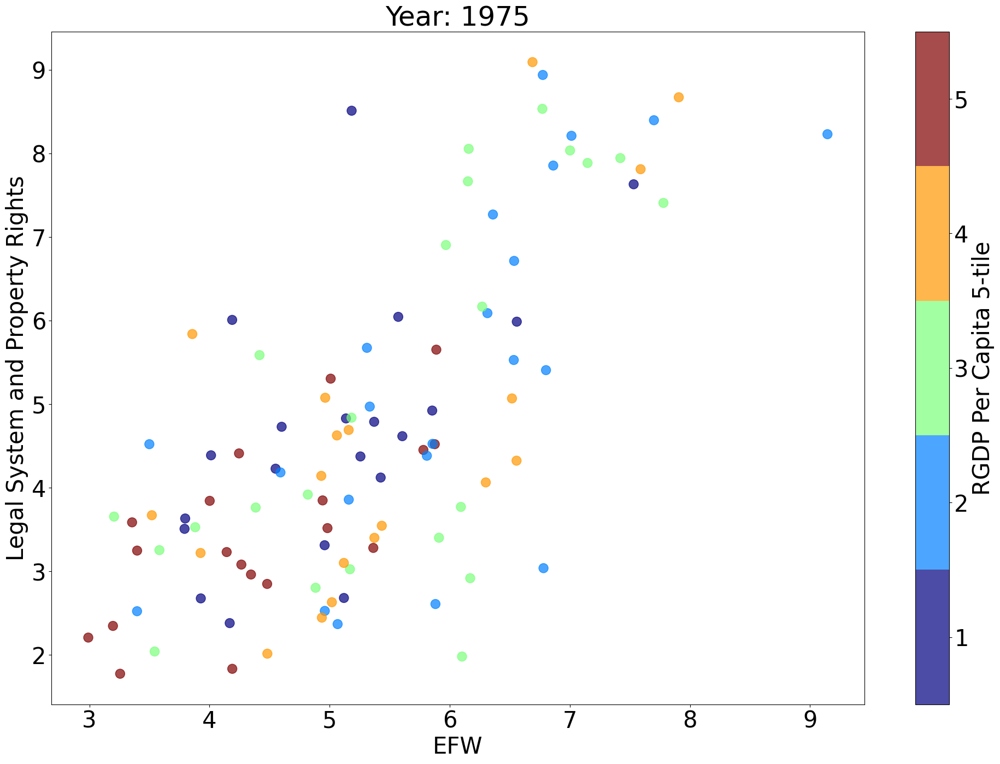

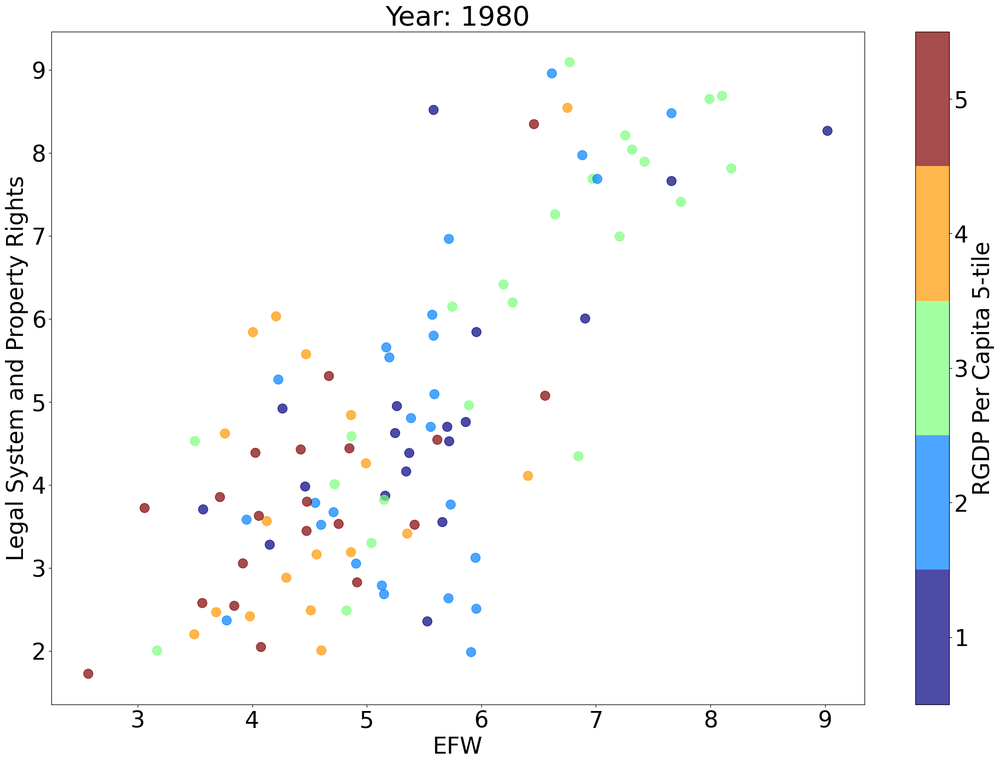

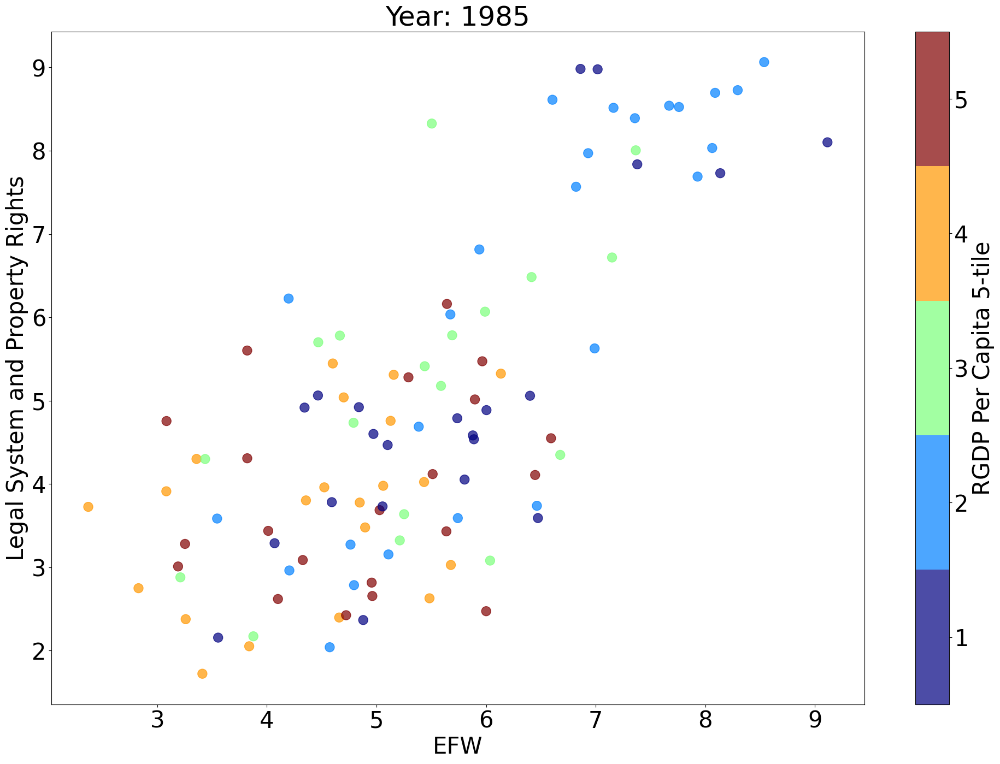

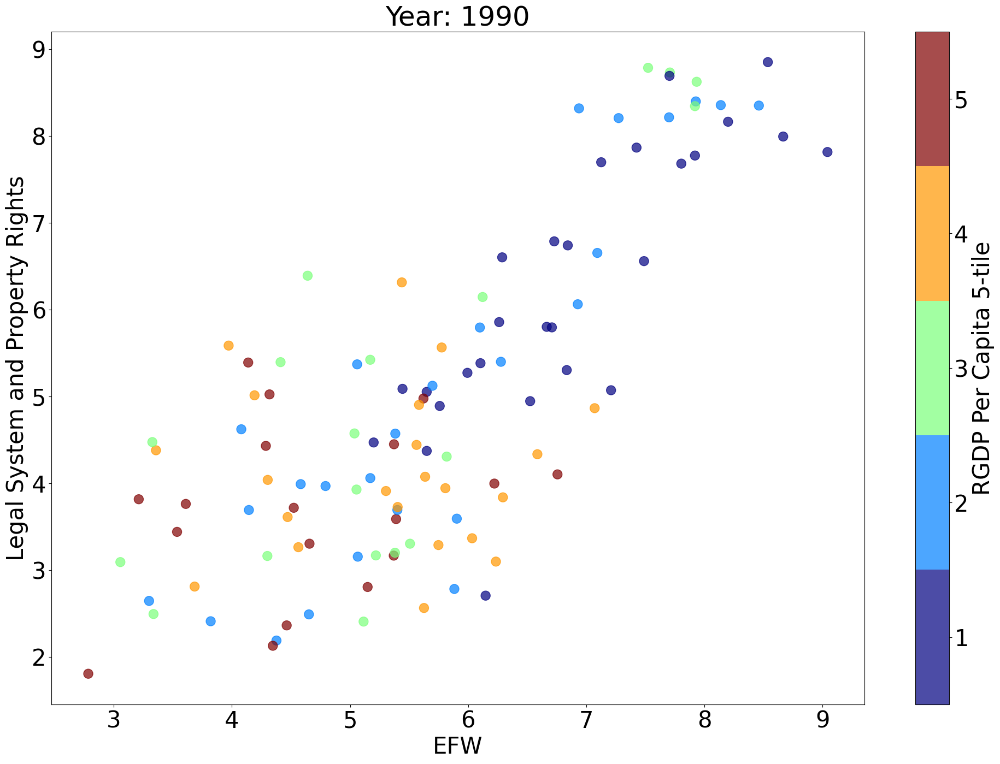

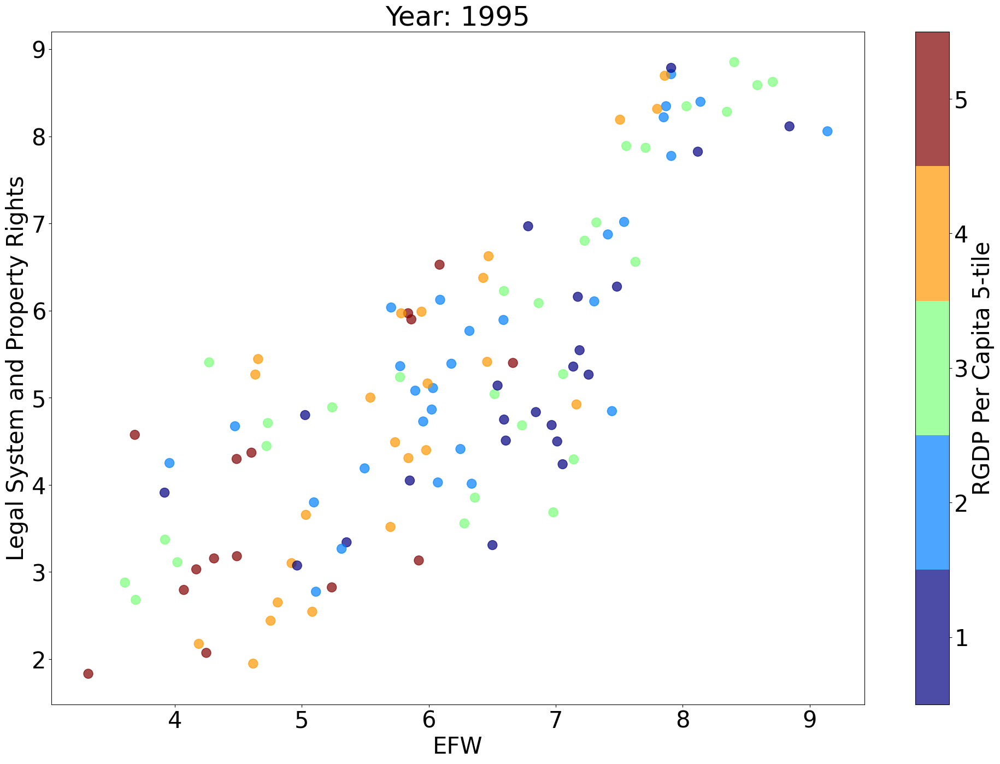

...

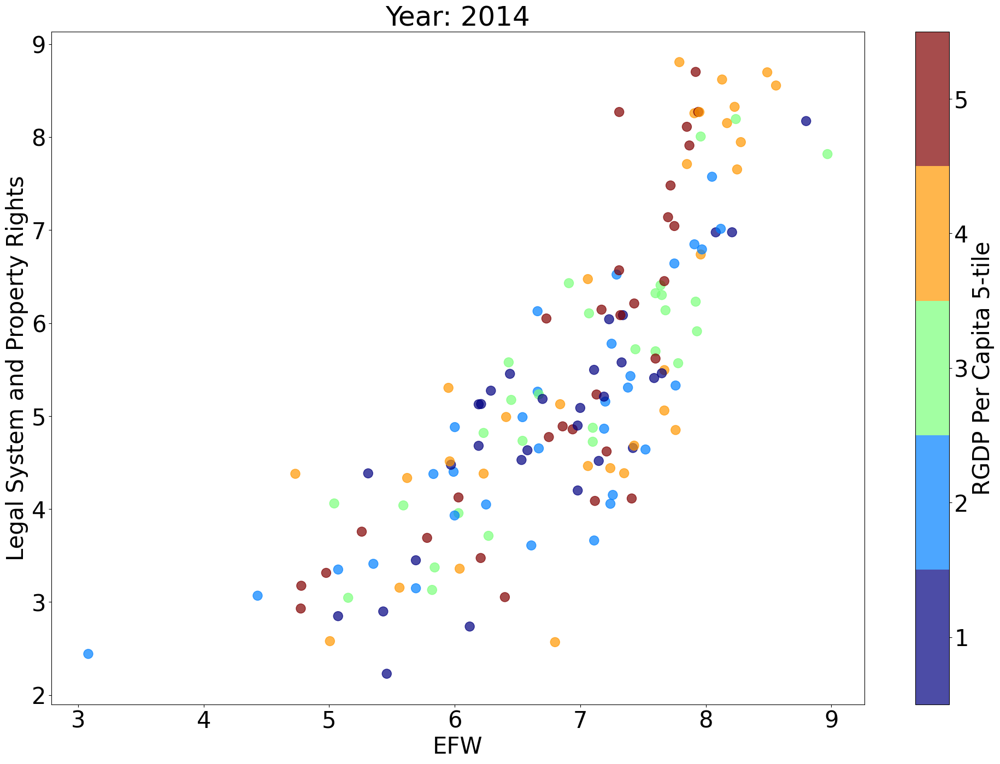

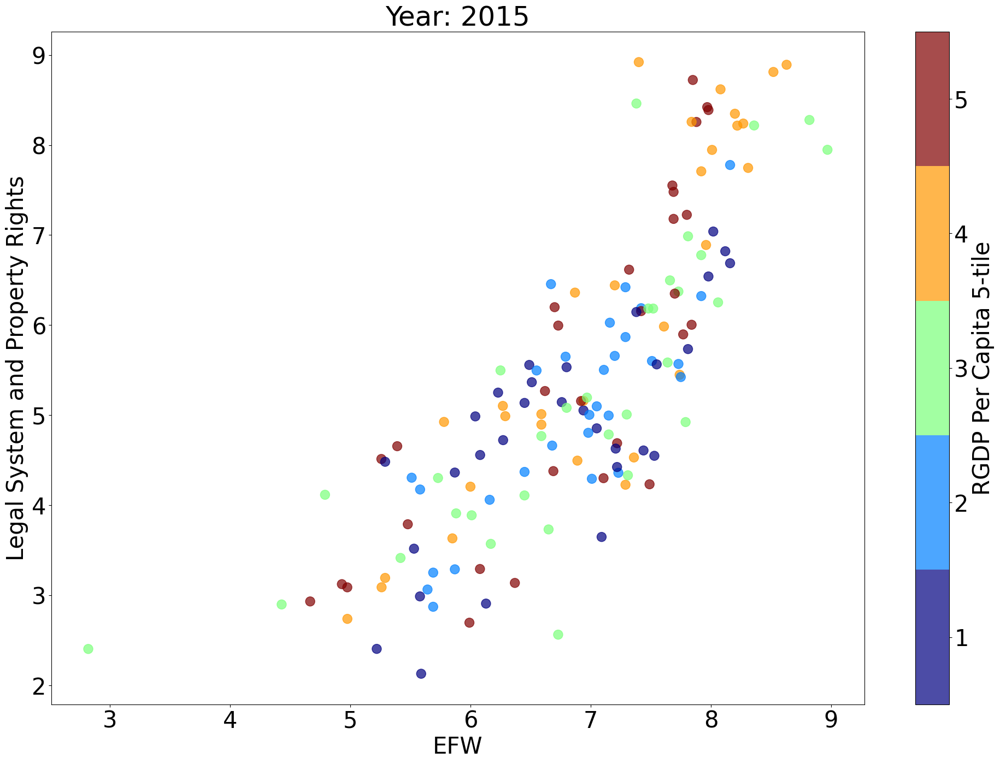

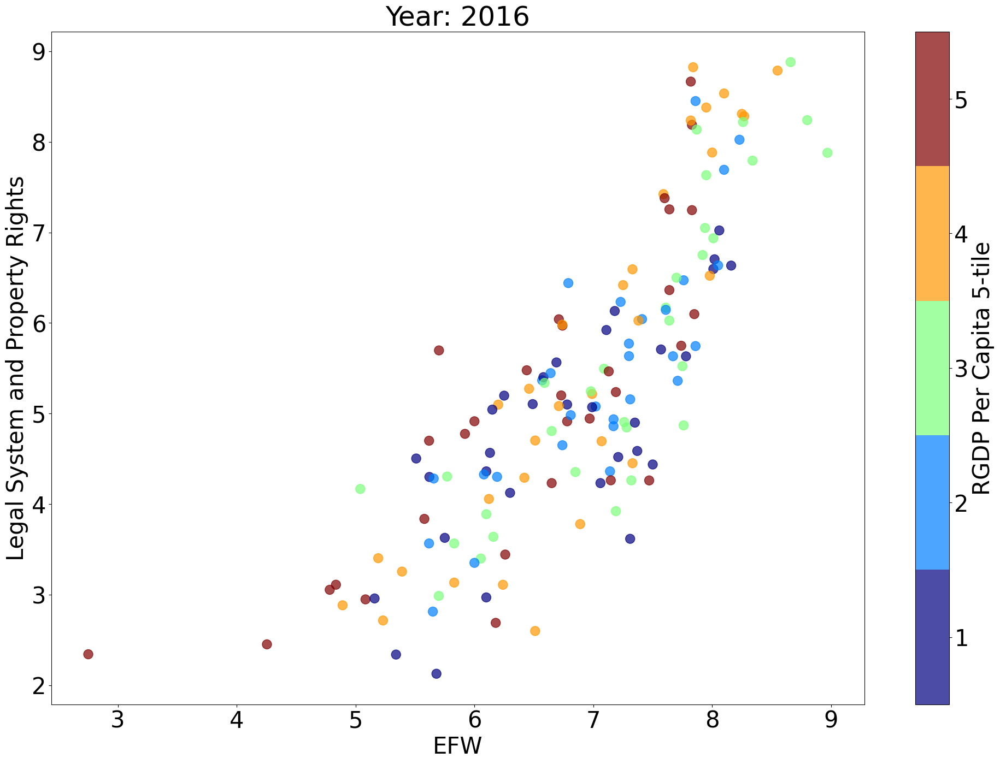

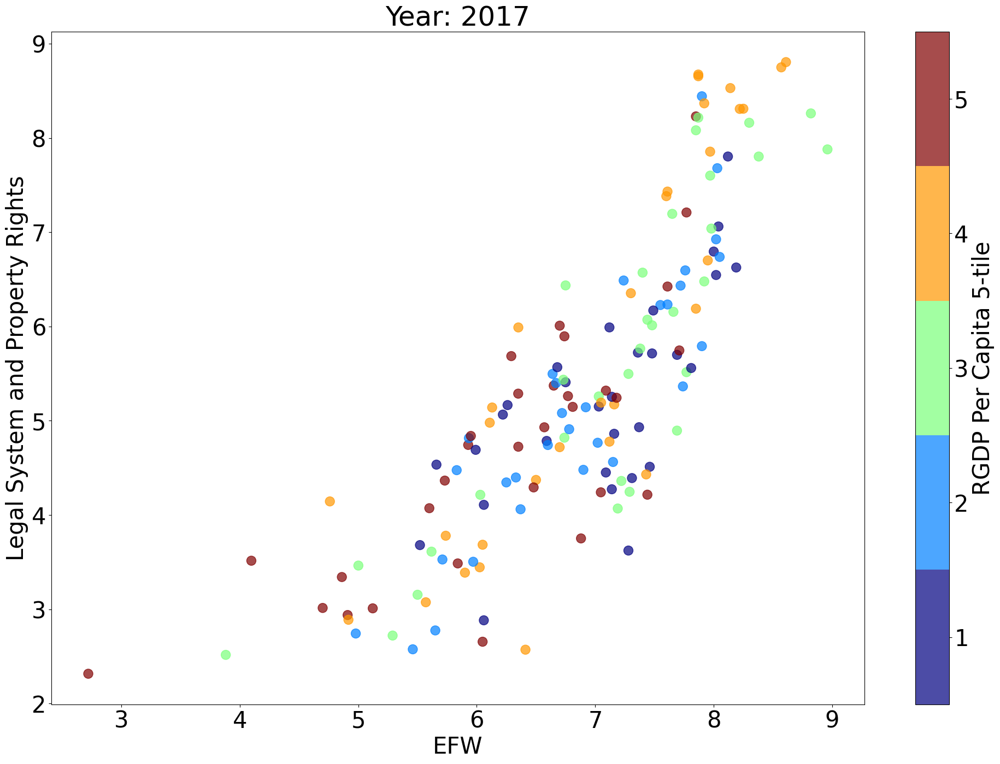

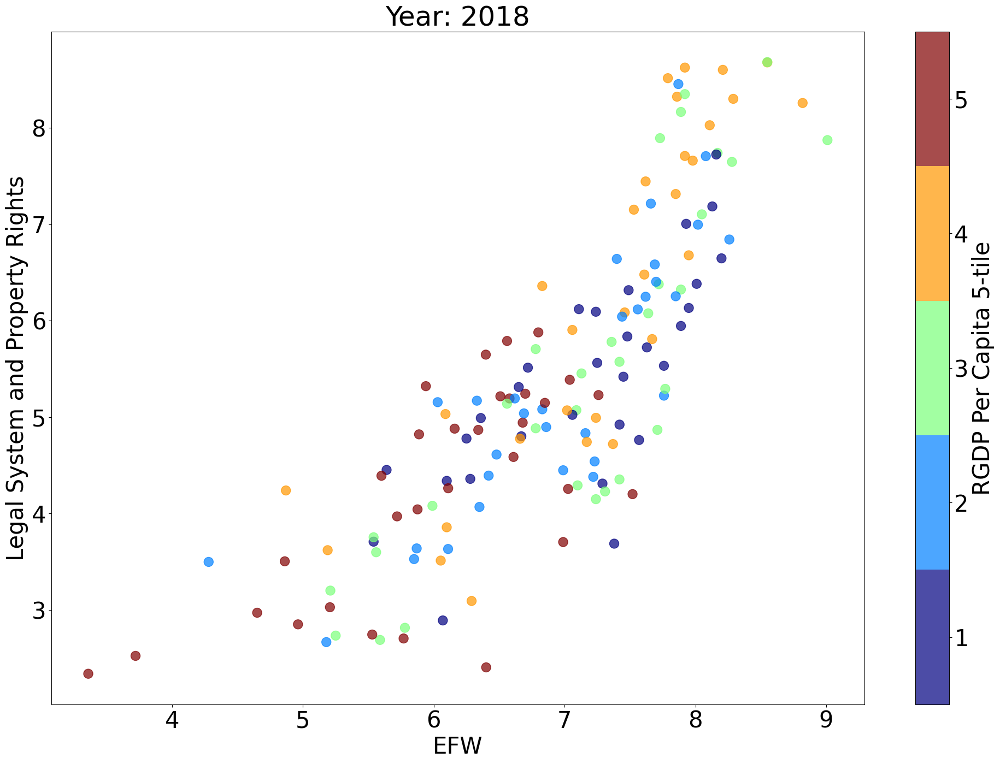

In [12]:
# Define a color map with n colors
cmap = cm.get_cmap('jet', n)

# Iterate through all years in the data
for year in years:
    # Select data for the given year
    plot_data = data[data.index.get_level_values('Year') == year]
    
    # Create a new figure and axis object
    fig, ax = plt.subplots(figsize = (24,16))
    
    # Create a scatter plot with the selected data
    plot_data.plot.scatter(x = 'EFW',
                           y = 'Legal System and Property Rights',
                           c = 'RGDP Per Capita ' + str(n) + '-tile',
                           cmap = cmap,
                           ax = ax,
                           s = 150,
                           vmin = .5, 
                           vmax = 5.5,
                           alpha = .7)
    
    # Set the title of the axis
    ax.set_title('Year: ' + str(year)[:4])

In [13]:
data[data['North America'] == 1].index.get_level_values('ISO_Code_3').unique()

Index(['BHS', 'BLZ', 'BRB', 'CAN', 'CRI', 'DOM', 'GTM', 'HND', 'HTI', 'JAM',
       'MEX', 'NIC', 'PAN', 'SLV', 'TTO', 'USA'],
      dtype='object', name='ISO_Code_3')

In [14]:
def regress(data, x_names, y_name, constant=False):
    # extract the independent variables
    X = data[x_names]
    # if a constant term is to be included
    if constant:
        X['constant'] = 1
    # extract the dependent variable
    y = data[y_name]
    # fit the linear regression model using OLS method
    results = sm.OLS(y, X).fit()
    return results 

# specify the dependent and independent variable names
y_name = ['EFW']
X_names = ['RGDP Per Capita']

# drop observations with missing values for the specified variables
reg_data = data.dropna()

# perform the regression
results = regress(reg_data, X_names, y_name, constant=False)

# print the summary of regression results
print(results.summary())


                                 OLS Regression Results                                
Dep. Variable:                    EFW   R-squared (uncentered):                   0.391
Model:                            OLS   Adj. R-squared (uncentered):              0.391
Method:                 Least Squares   F-statistic:                              1672.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):                   8.50e-283
Time:                        02:27:31   Log-Likelihood:                         -8019.7
No. Observations:                2606   AIC:                                  1.604e+04
Df Residuals:                    2605   BIC:                                  1.605e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

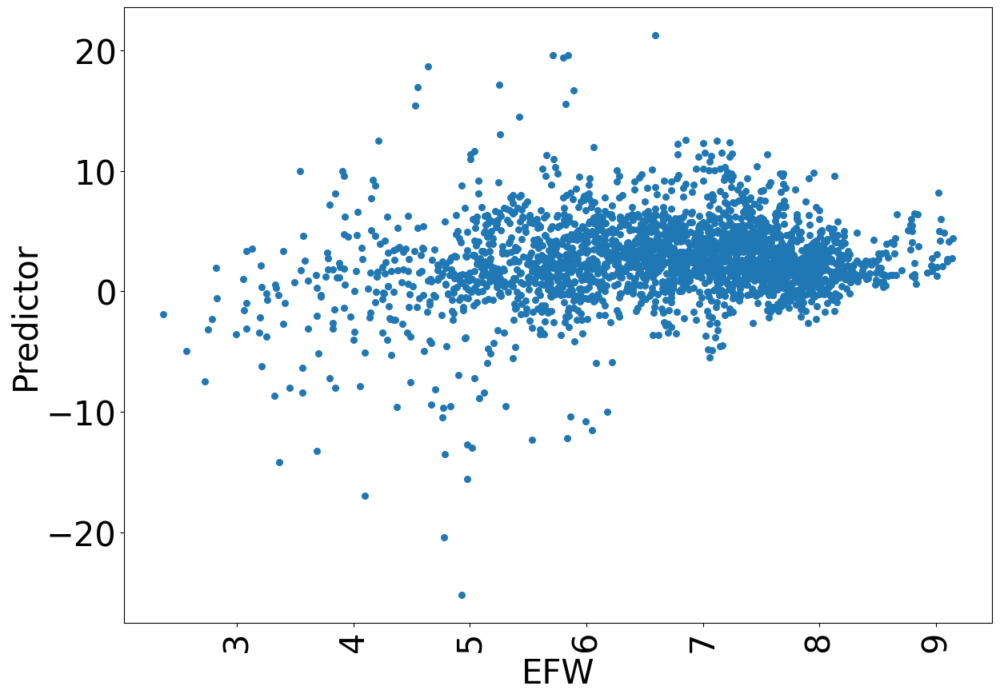

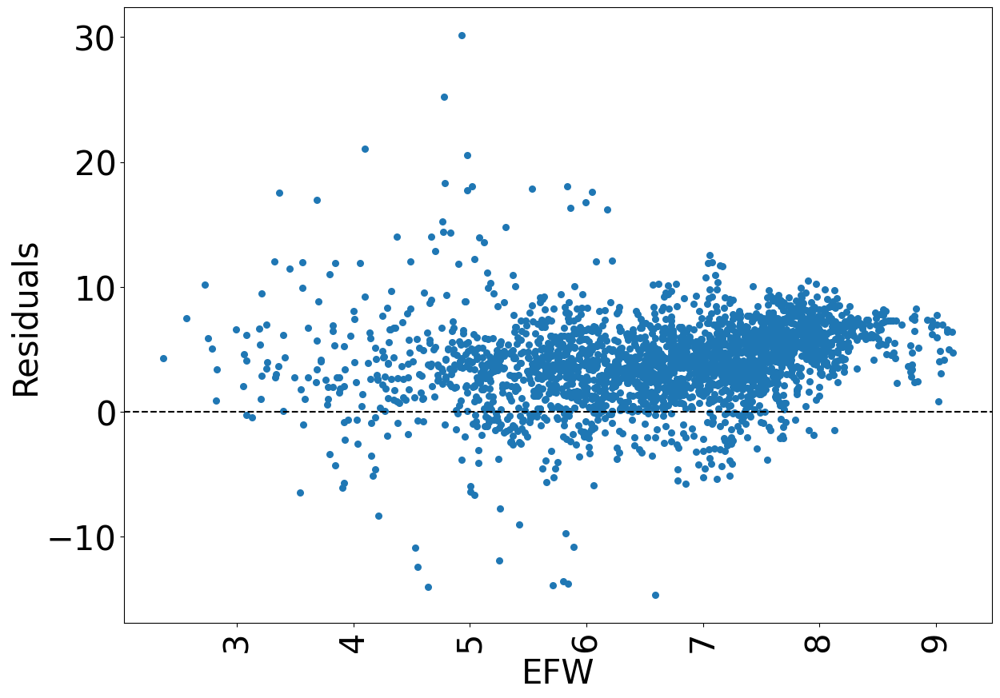

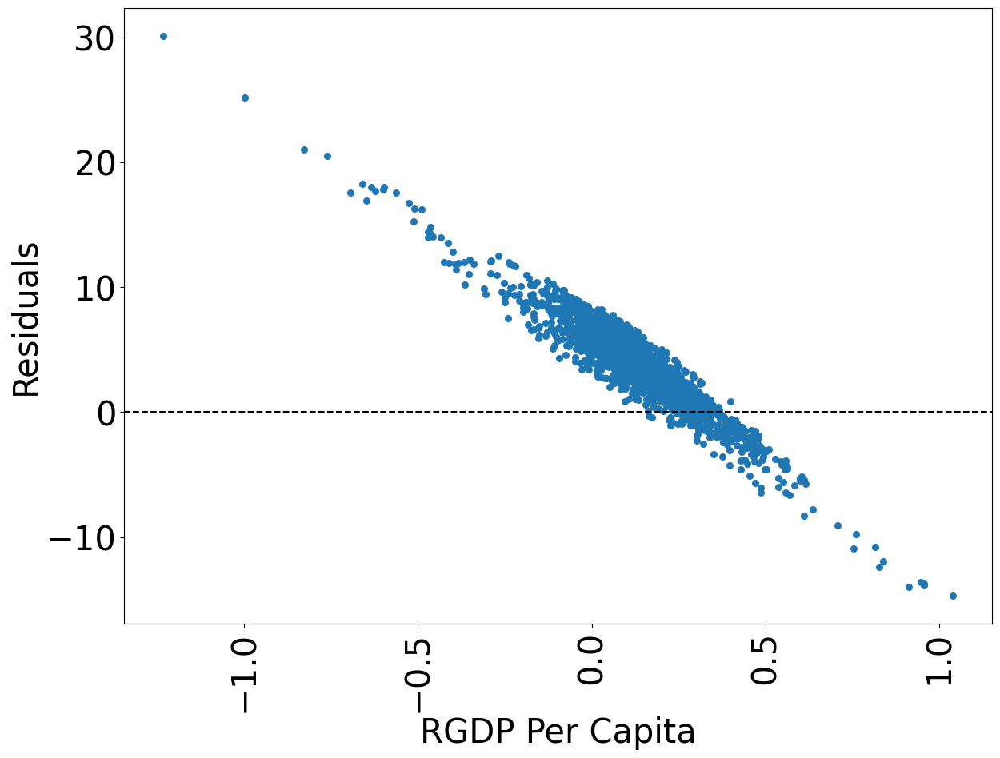

In [15]:
def plot_residuals(df, y_var, x_vars):
    # create scatterplot of predicted values vs. actual values
    fig, ax = plt.subplots(figsize = (14, 10))
    df.plot.scatter(x = y_var[0],
                     y = 'Predictor', 
                      s = 30, ax = ax)
    plt.xticks(rotation=90)
    plt.show()
    plt.close()

    #   cycle through all variables included in regression
    #   concatenate y_var and x_vars to form a single list

    # create scatterplots of residuals vs. each predictor variable
    #   and vs. the outcome variable itself
    for var in y_var + x_vars:
        fig, ax = plt.subplots(figsize = (14,10))
        df.plot.scatter(x = var,
                         y = 'Residuals', 
                          s = 30, ax = ax)
        ax.axhline(0, ls = '--', color = 'k')
        plt.xticks(rotation=90)
        plt.show()
        plt.close()

# add predicted and residual columns to data
reg_data['Predictor'] = results.predict()
reg_data['Residuals'] = results.resid

# call the function to plot the residuals
plot_residuals(reg_data, y_name, X_names)

In [16]:
# define the predictor variables
X_names = ['RGDP Per Capita 5-tile']

# run the regression with the predictor variables and the response variable
results = regress(reg_data, X_names, y_name, constant = False)

# print the summary of the regression results
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                    EFW   R-squared (uncentered):                   0.792
Model:                            OLS   Adj. R-squared (uncentered):              0.792
Method:                 Least Squares   F-statistic:                              9901.
Date:                Thu, 27 Apr 2023   Prob (F-statistic):                        0.00
Time:                        02:27:33   Log-Likelihood:                         -6621.6
No. Observations:                2606   AIC:                                  1.325e+04
Df Residuals:                    2605   BIC:                                  1.325e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

In [17]:
# define the independent and dependent variables
X_names = ['RGDP Per Capita']
y_name = ['EFW']

# group the data by ISO code and take the difference of each variable from year to year
reg_data = reg_data[y_name + X_names].groupby('ISO_Code_3').diff().dropna()

# perform the regression with the specified variables and print the summary
results = regress(reg_data, X_names, y_name, constant = False)
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:                    EFW   R-squared (uncentered):                   0.062
Model:                            OLS   Adj. R-squared (uncentered):              0.062
Method:                 Least Squares   F-statistic:                              162.3
Date:                Thu, 27 Apr 2023   Prob (F-statistic):                    4.79e-36
Time:                        02:27:33   Log-Likelihood:                         -695.68
No. Observations:                2453   AIC:                                      1393.
Df Residuals:                    2452   BIC:                                      1399.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

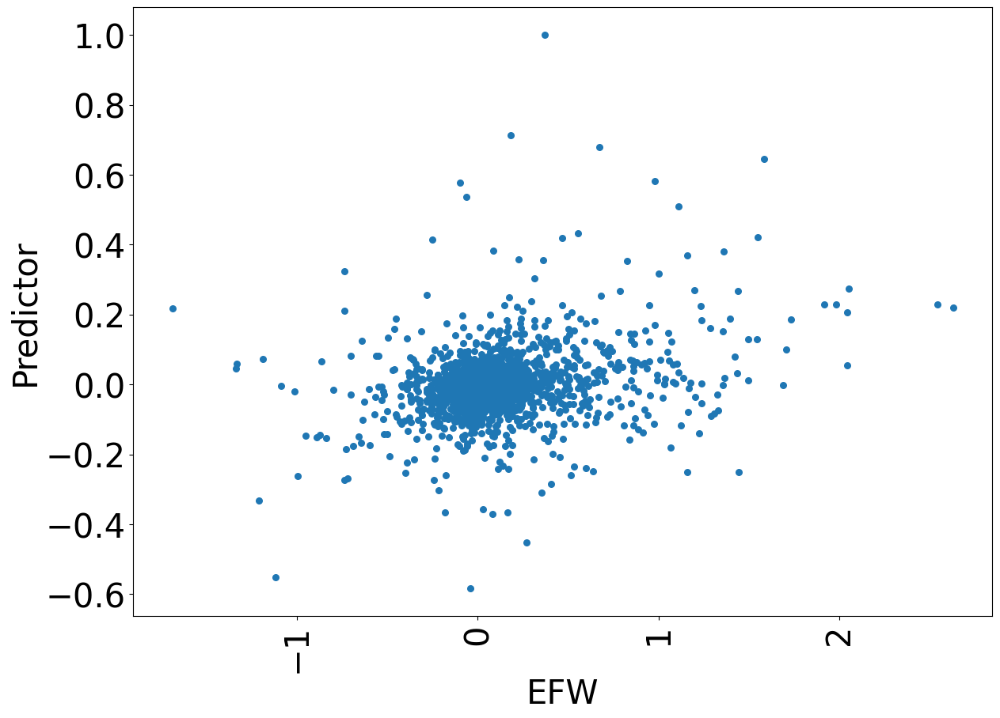

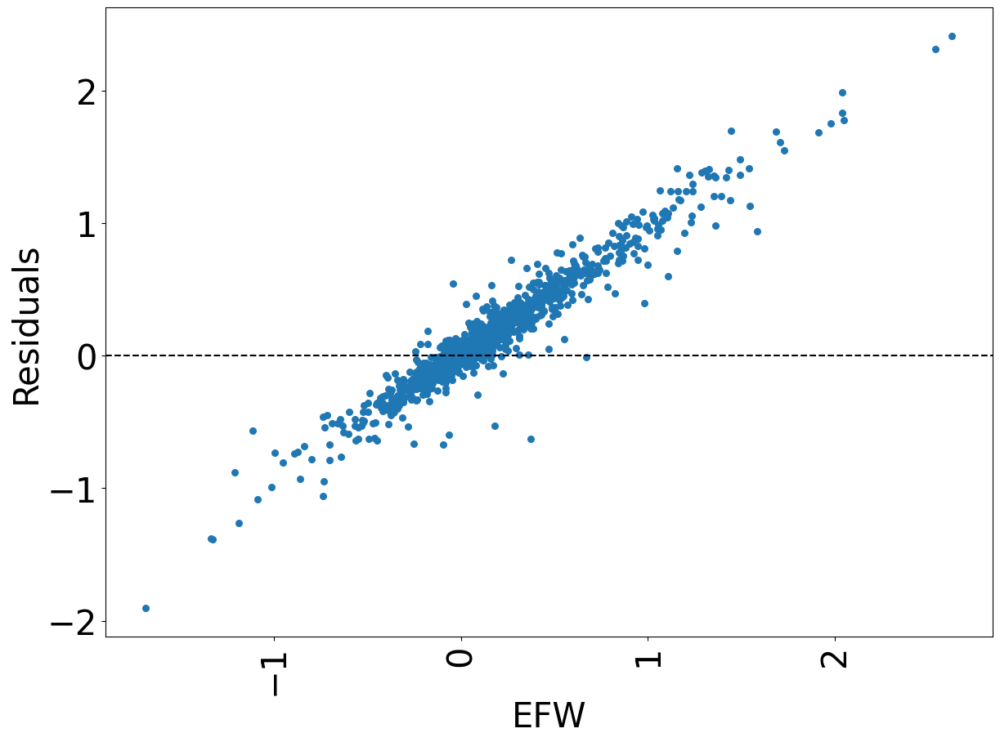

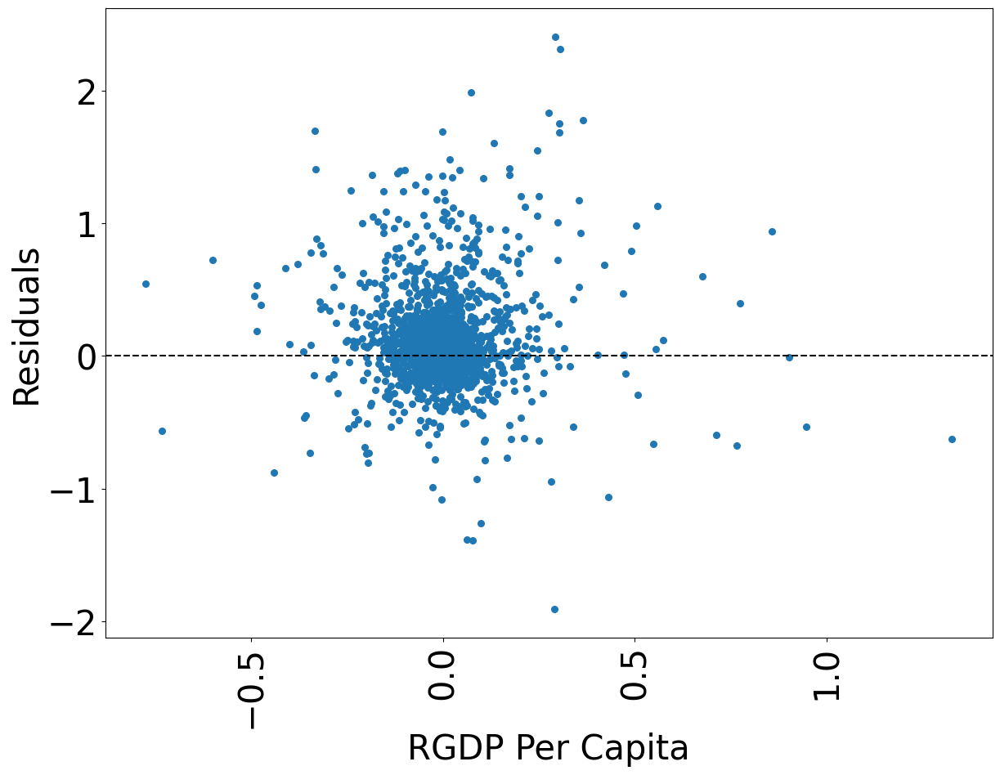

In [18]:
# Create predicted values and residuals from regression results
reg_data['Predictor'] = results.predict()
reg_data['Residuals'] = results.resid

# Plot residuals and predictor against each variable separately
plot_residuals(reg_data, y_name, X_names)

In [19]:
def panel_regress(data, x_names, y_name, 
                  constant = False, 
                  entity = False, 
                  time = False):
    # Extract X and y variables from data
    X = data[x_names]
    if constant:
        X["constant"] = 1
    y = data[y_name]
    # Fit a panel regression model with specified settings
    results = PanelOLS(y, X,
                      entity_effects = entity,
                      time_effects = time).fit(cov_type='clustered', cluster_entity=True)
    # Return the regression results
    return results 

# Select data with no missing values
reg_data = data.dropna()
# Perform panel regression
results = panel_regress(reg_data, X_names, 
              y_name,
              constant = True,
             entity = True,
             time = True)

# Print the panel regression results
print(results)

                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0808
Estimator:                   PanelOLS   R-squared (Between):              0.0234
No. Observations:                2606   R-squared (Within):               0.0472
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0225
Time:                        02:27:35   Log-likelihood                   -1494.7
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      213.84
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(1,2433)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             37.764
                            

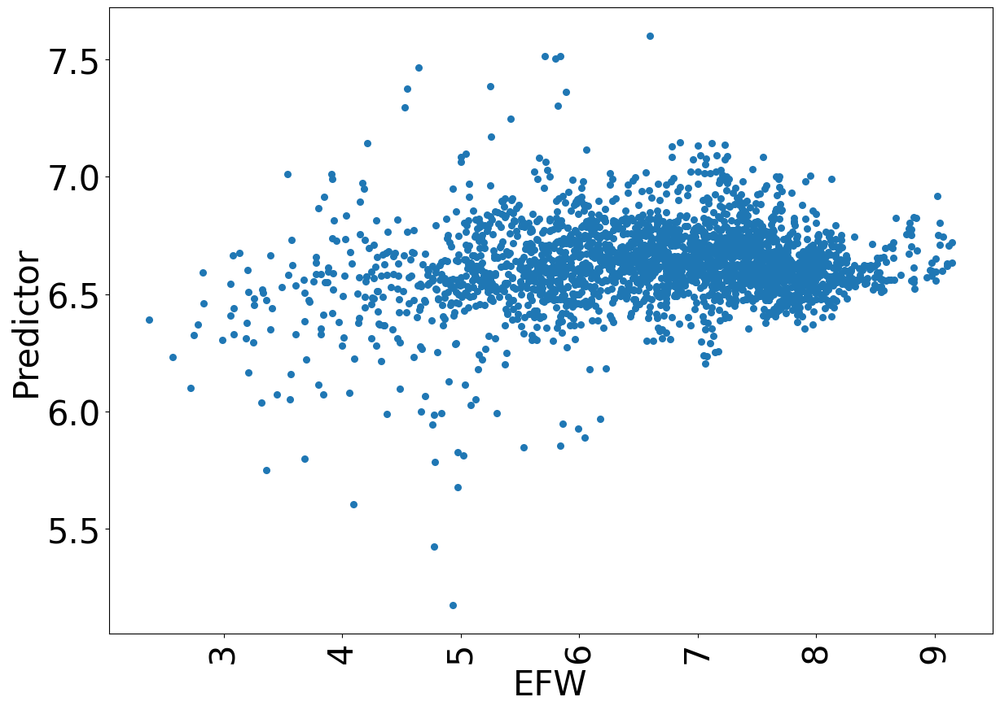

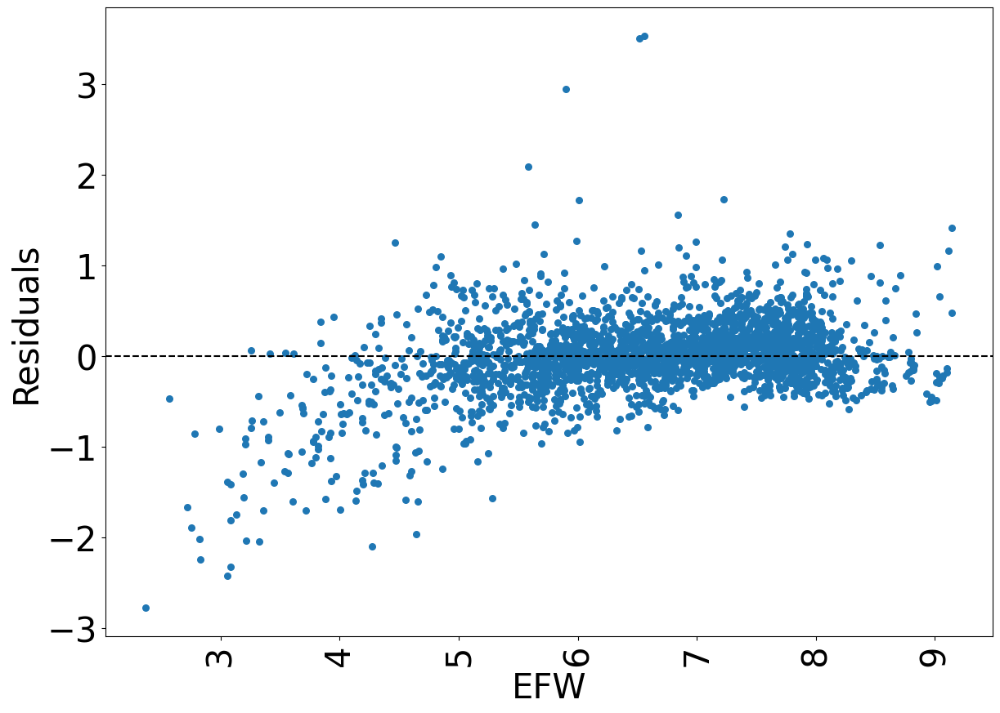

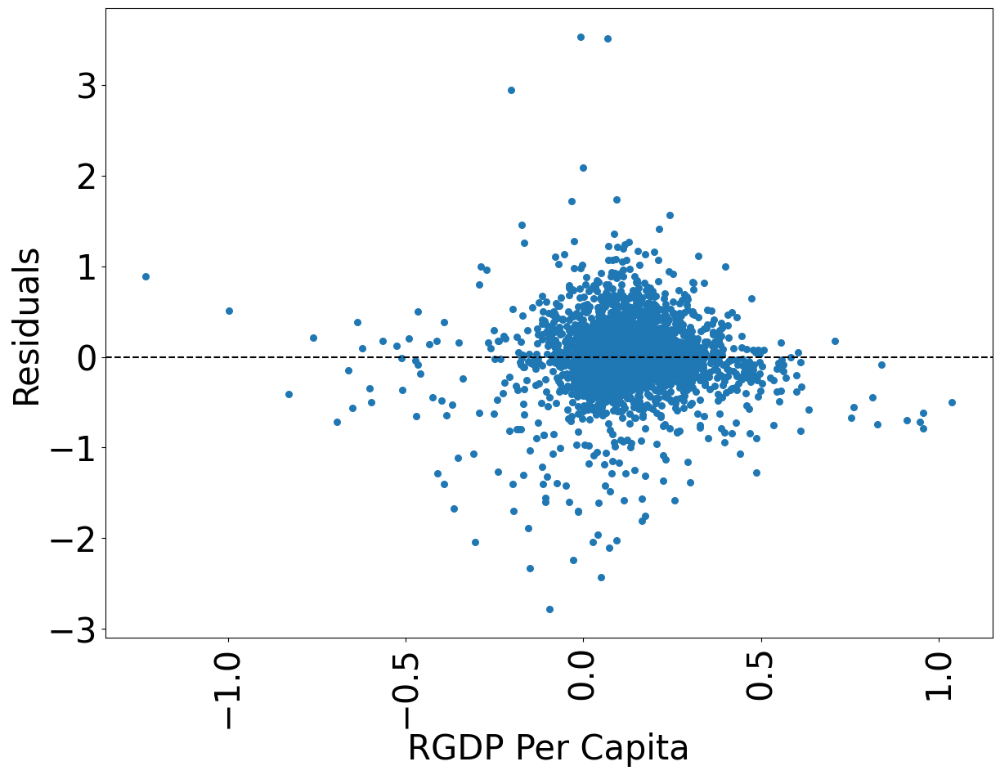

In [20]:
reg_data['Predictor'] = results.predict()
reg_data['Residuals'] = results.resids
plot_residuals(reg_data, y_name, X_names)

Entity: True
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0808
Estimator:                   PanelOLS   R-squared (Between):              0.0234
No. Observations:                2606   R-squared (Within):               0.0472
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0225
Time:                        02:27:37   Log-likelihood                   -1494.7
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      213.84
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(1,2433)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             37.764
    

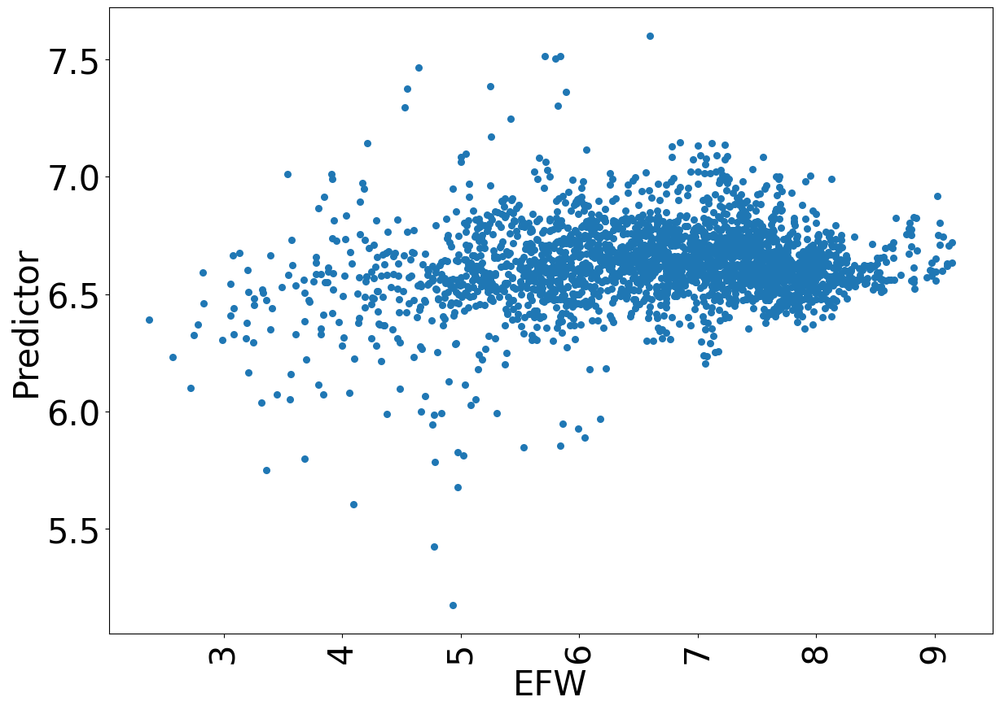

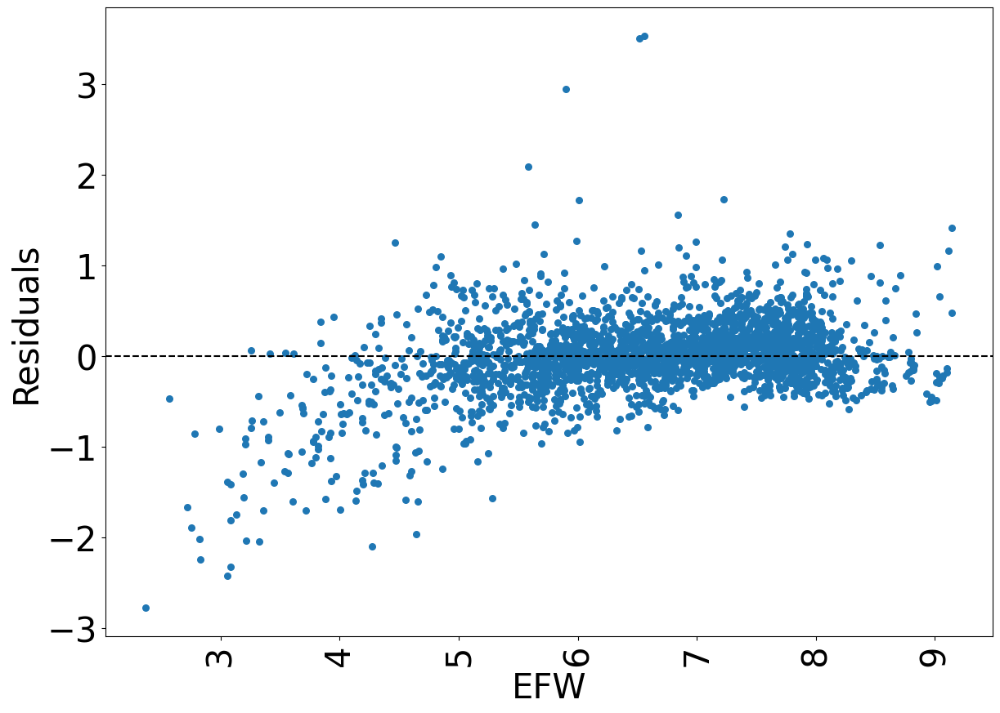

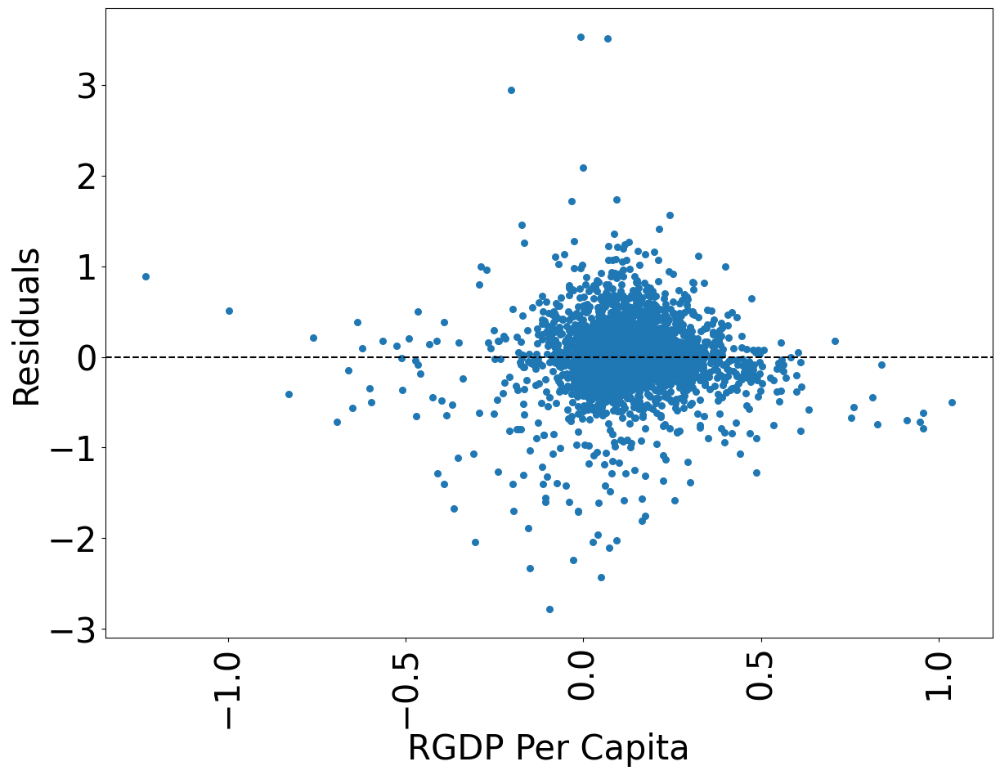

Entity: True
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0474
Estimator:                   PanelOLS   R-squared (Between):              0.0240
No. Observations:                2606   R-squared (Within):               0.0474
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0224
Time:                        02:27:38   Log-likelihood                   -2627.7
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      121.97
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(1,2452)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             18.143
   

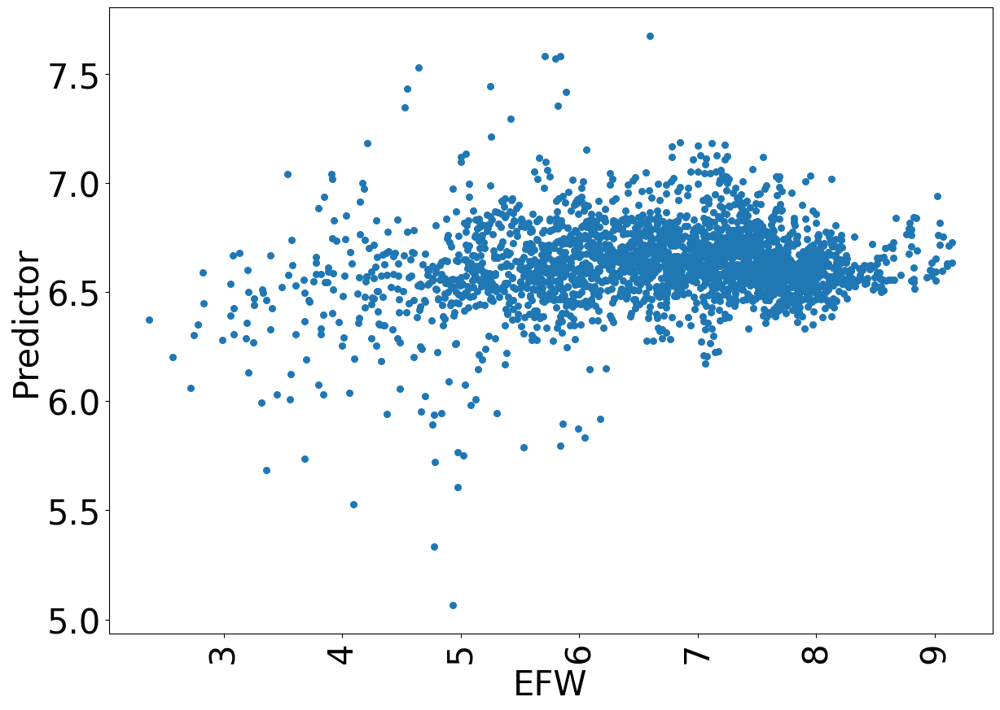

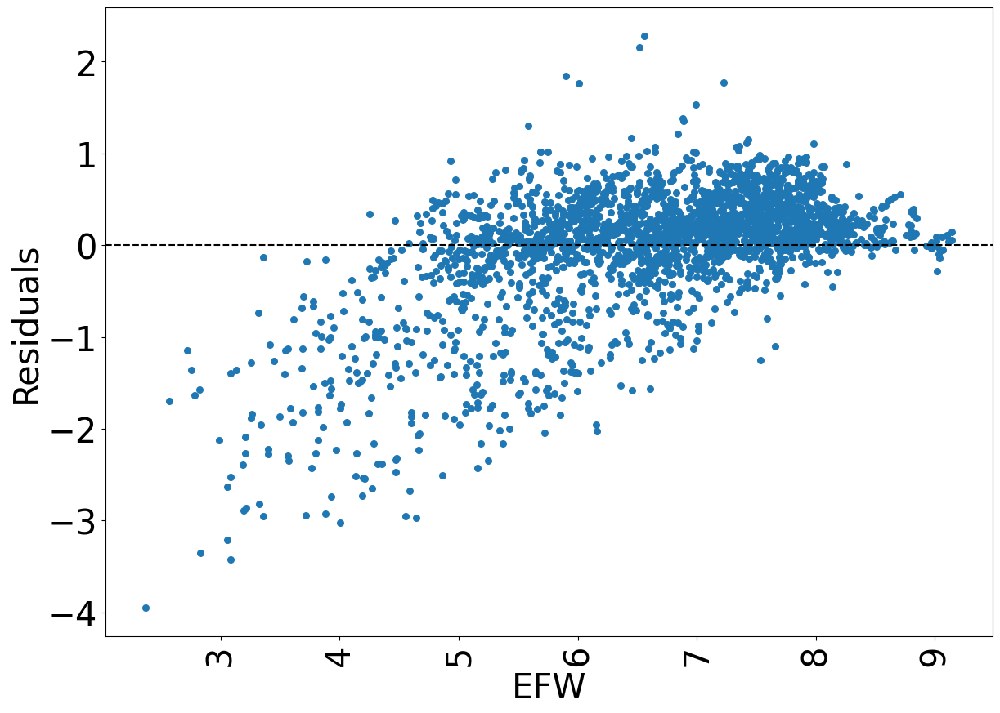

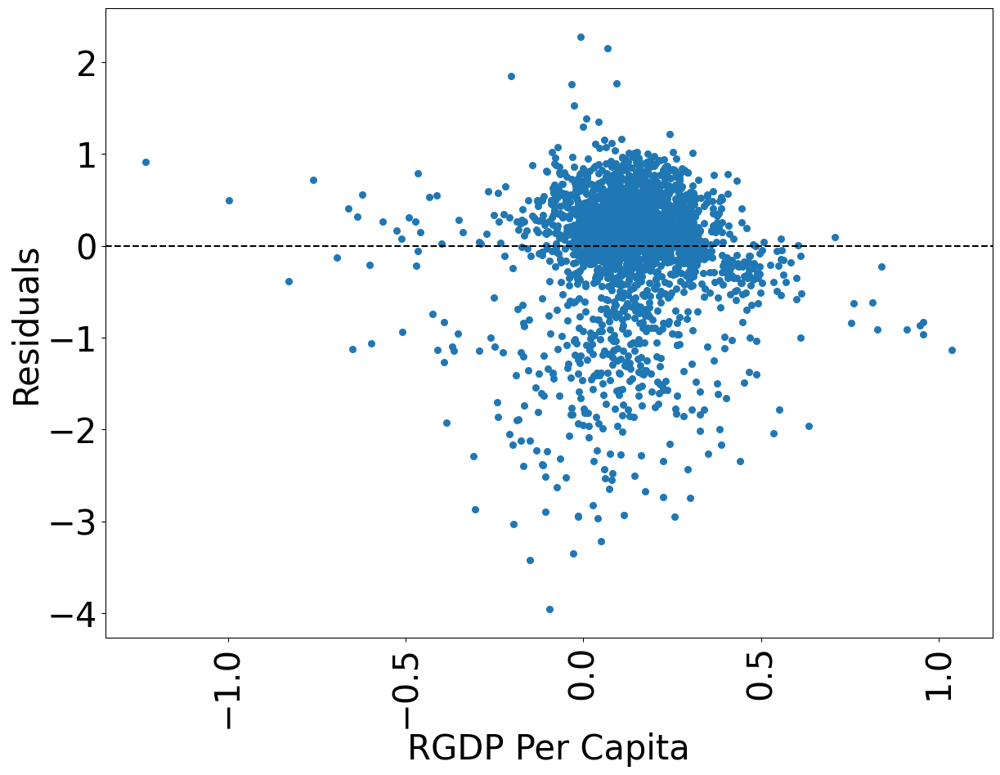

Entity: False
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0179
Estimator:                   PanelOLS   R-squared (Between):              0.0221
No. Observations:                2606   R-squared (Within):               0.0458
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0221
Time:                        02:27:40   Log-likelihood                   -3875.3
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      47.162
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(1,2585)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             5.9226
   

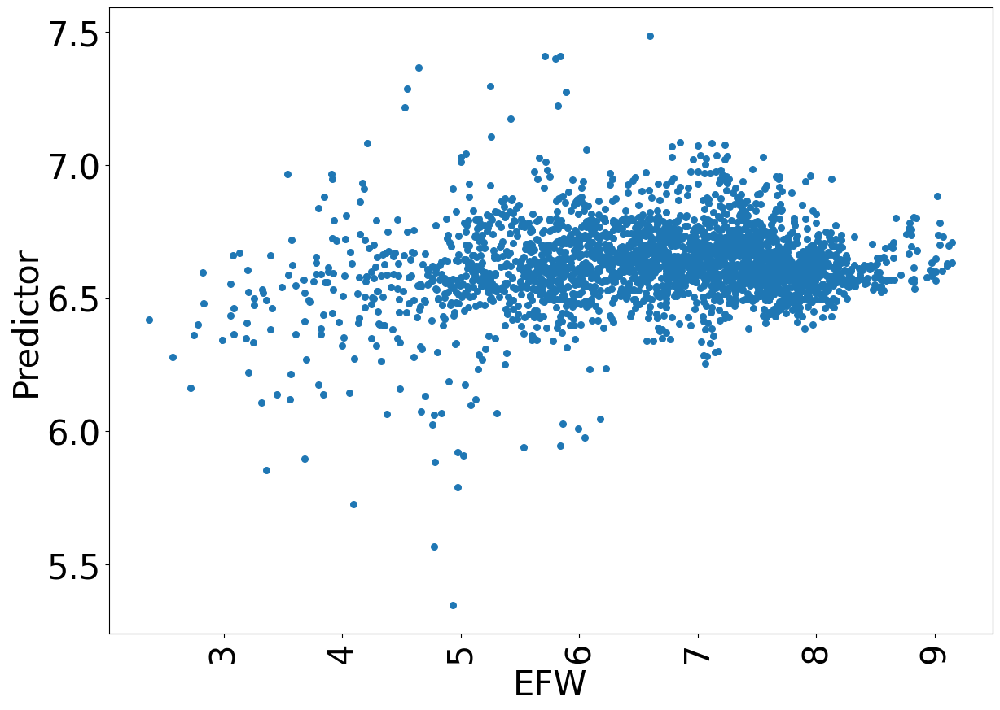

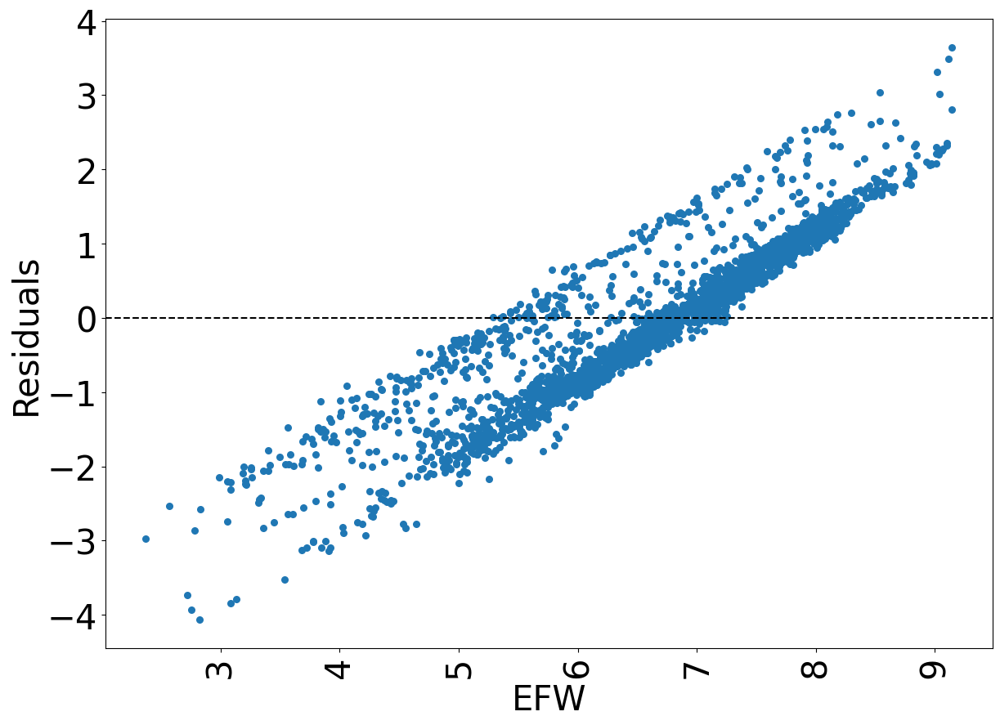

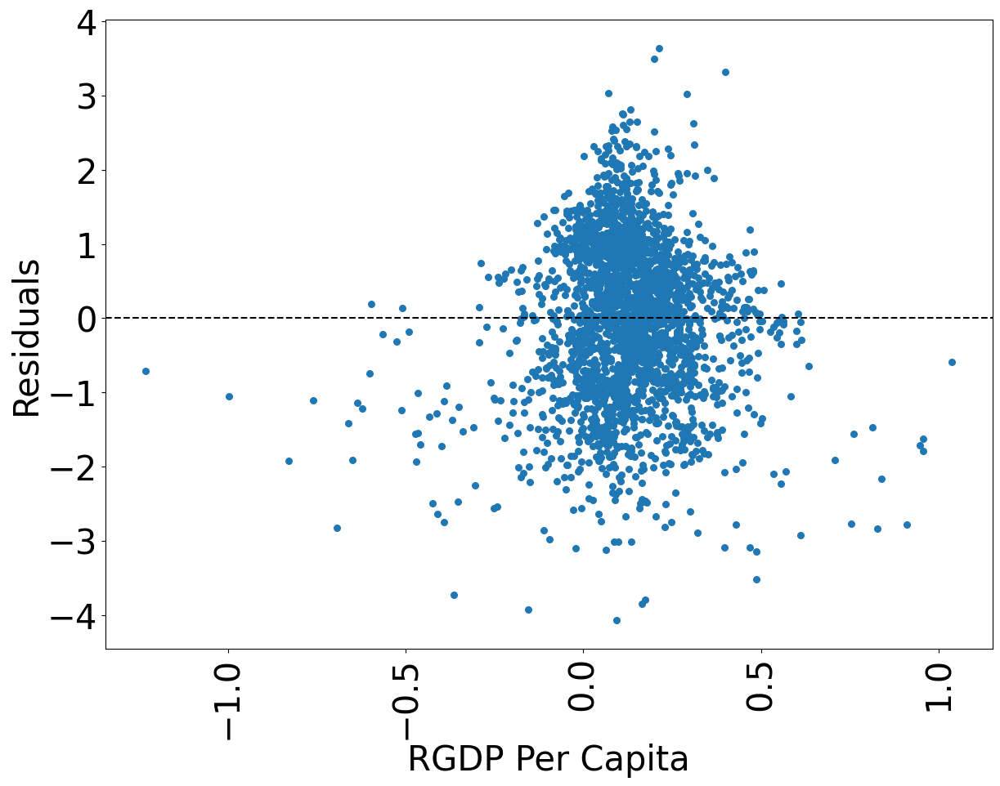

Entity: False
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:                    EFW   R-squared:                        0.0225
Estimator:                   PanelOLS   R-squared (Between):              0.0235
No. Observations:                2606   R-squared (Within):               0.0472
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0225
Time:                        02:27:42   Log-likelihood                   -4080.4
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      59.988
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(1,2604)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             9.1574
  

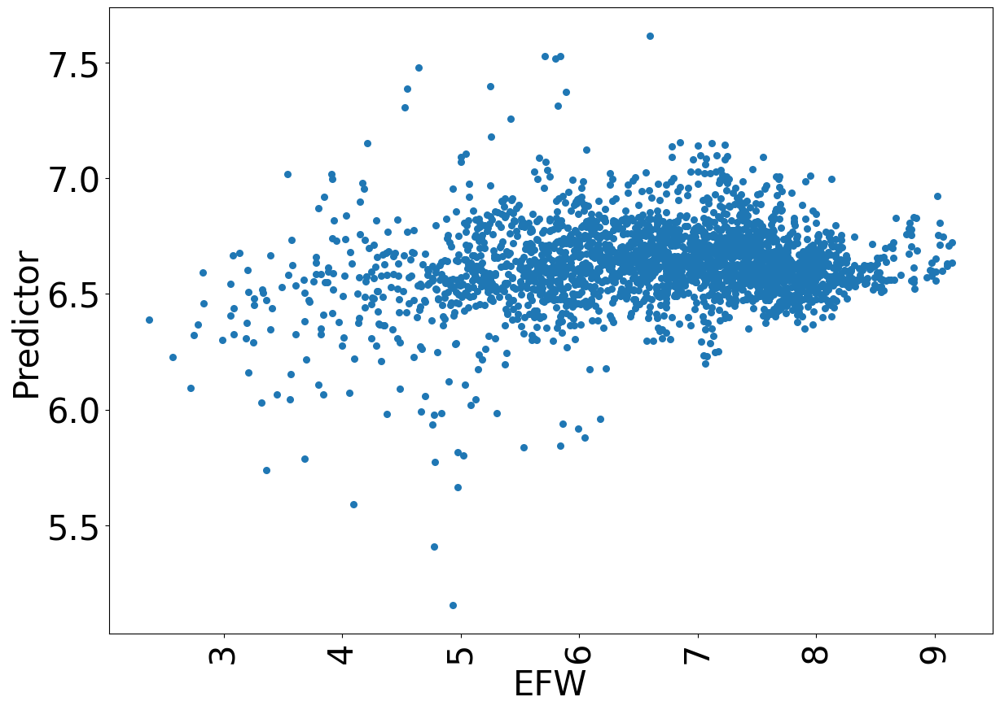

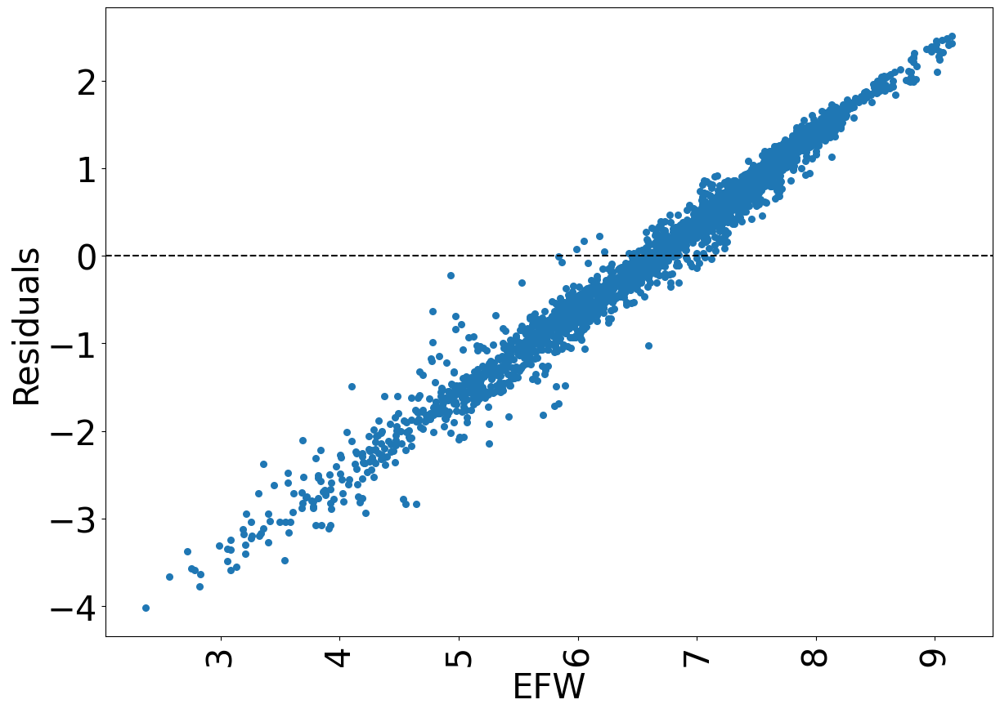

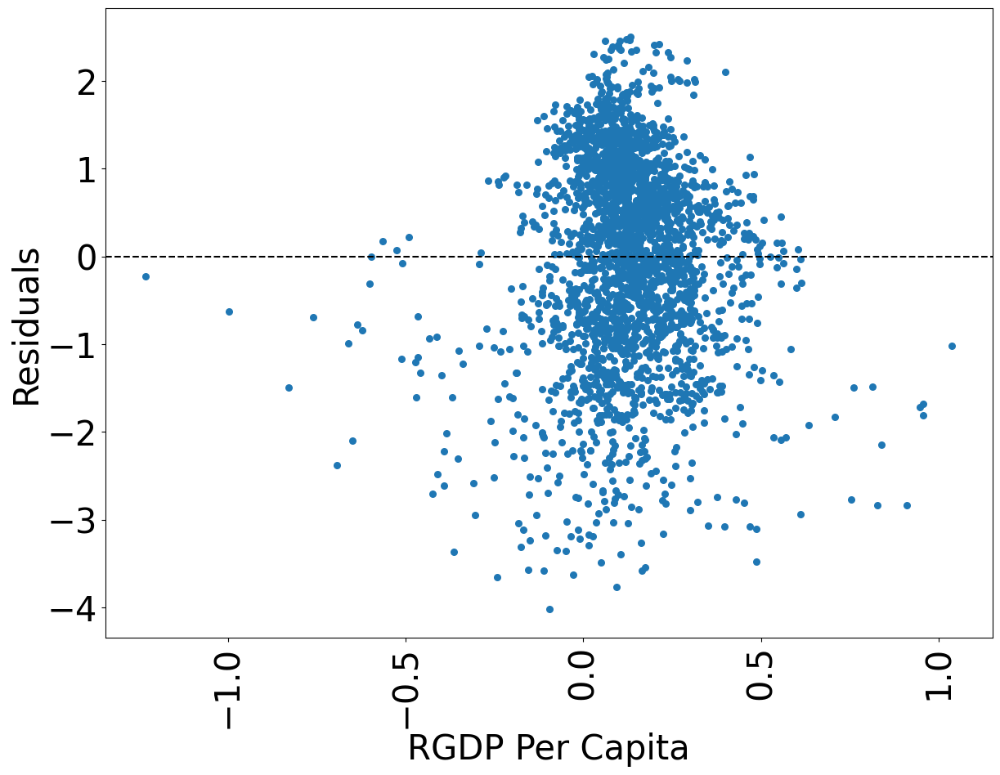

In [21]:
# loop through different combinations of entity and time effects
for entity in [True, False]:
    for time in [True, False]:
        # drop missing values from data
        reg_data = data.dropna()
        # run panel regression with specified options
        results = panel_regress(reg_data, X_names, 
                      y_name,
                      constant = True,
                     entity = entity,
                     time = time)
        # print entity and time effect status and regression results
        print('Entity: ' + str(entity) + '\nTime: ' + str(time))
        print(results)
        # calculate and plot residuals for each combination of entity and time effects
        reg_data['Predictor'] = results.predict()
        reg_data['Residuals'] = results.resids
        plot_residuals(reg_data, y_name, X_names)

Entity: True
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0887
Estimator:                   PanelOLS   R-squared (Between):             -0.2151
No. Observations:                2606   R-squared (Within):               0.0064
Date:                Thu, Apr 27 2023   R-squared (Overall):             -0.1558
Time:                        02:27:44   Log-likelihood                    1969.5
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      47.256
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(5,2429)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             11.164
    

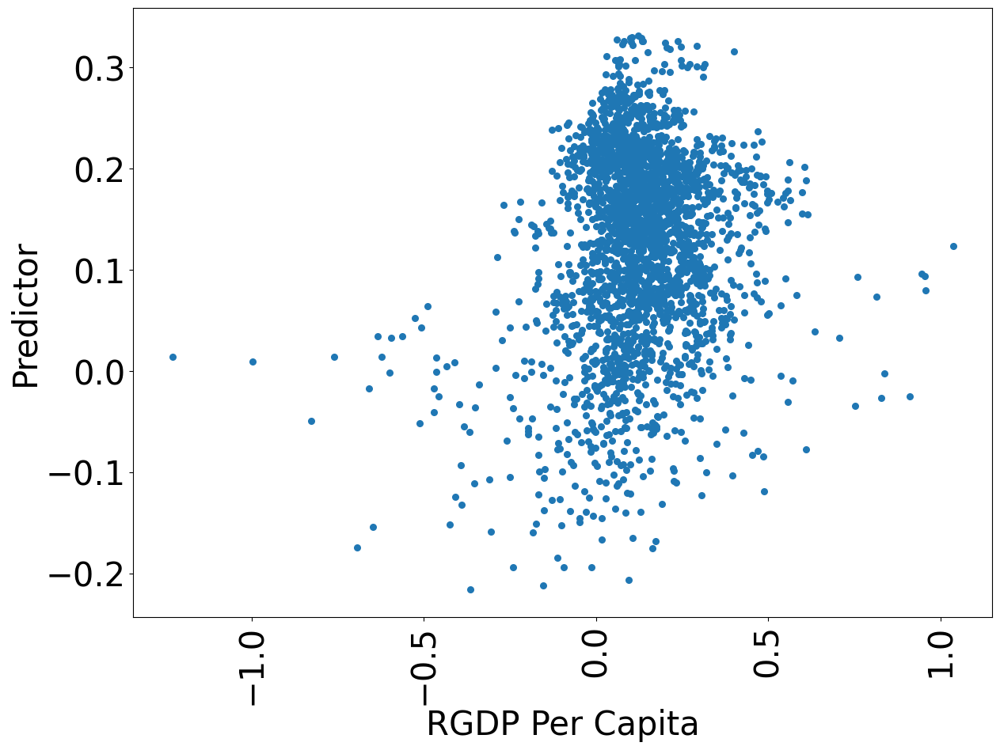

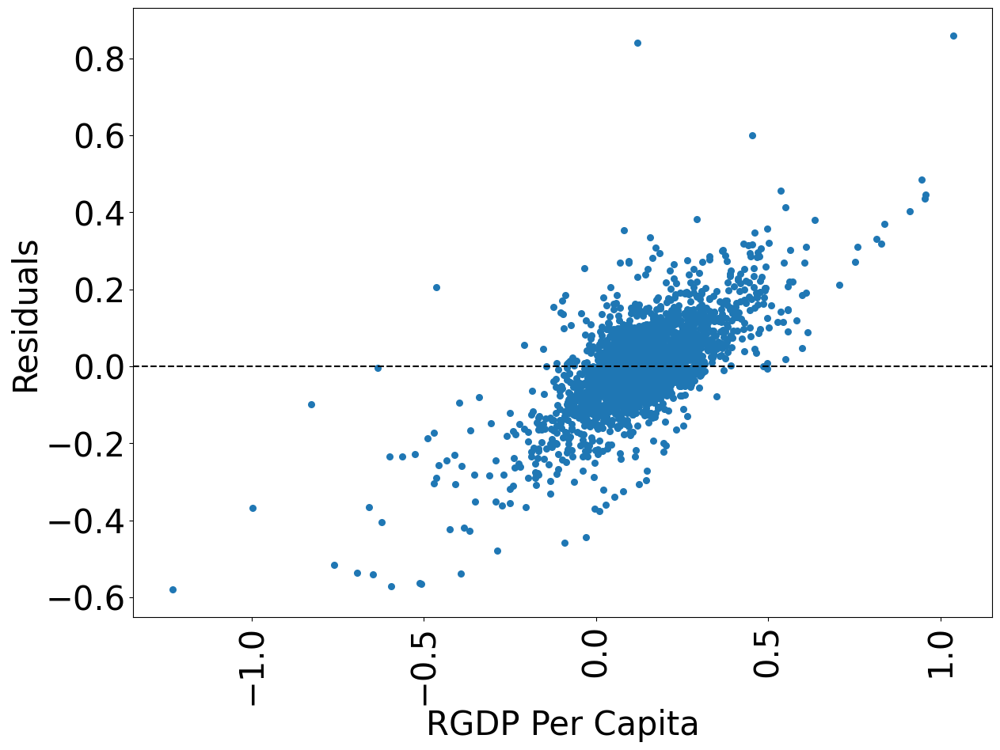

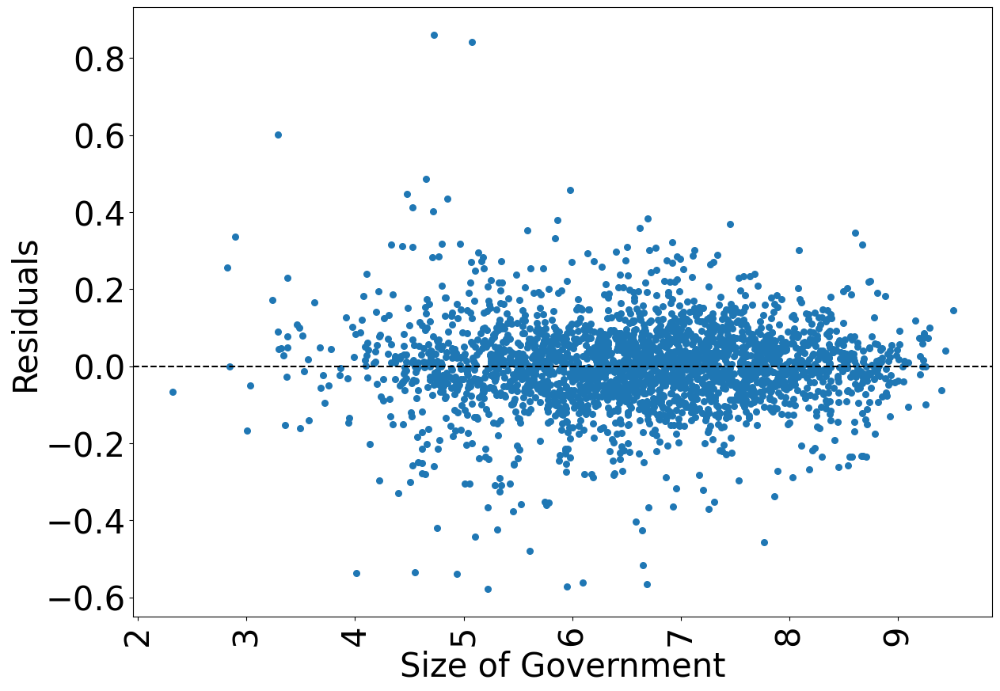

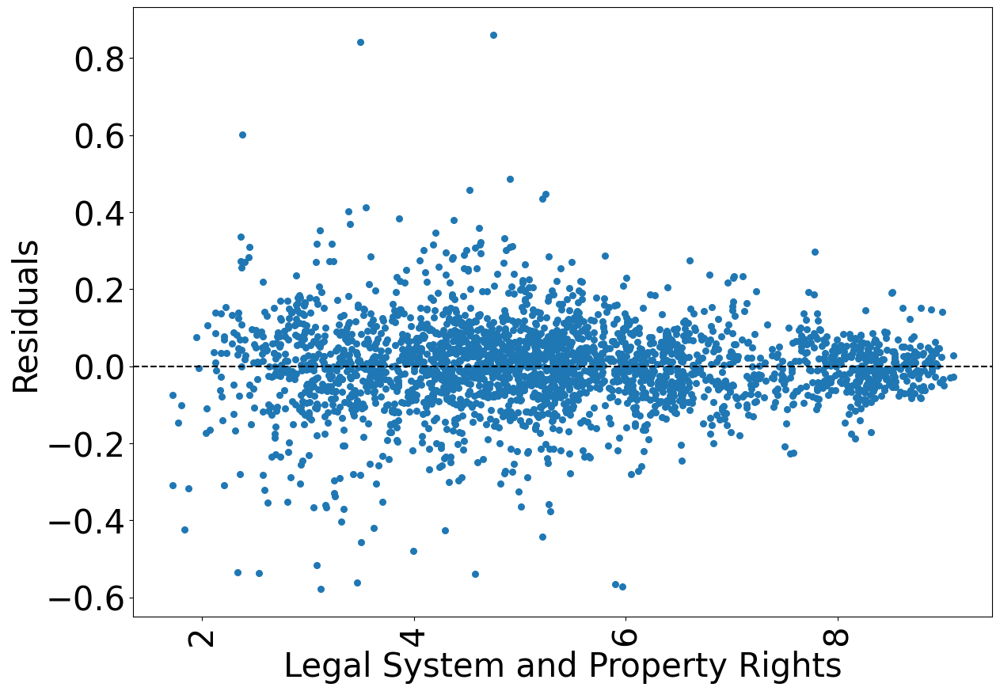

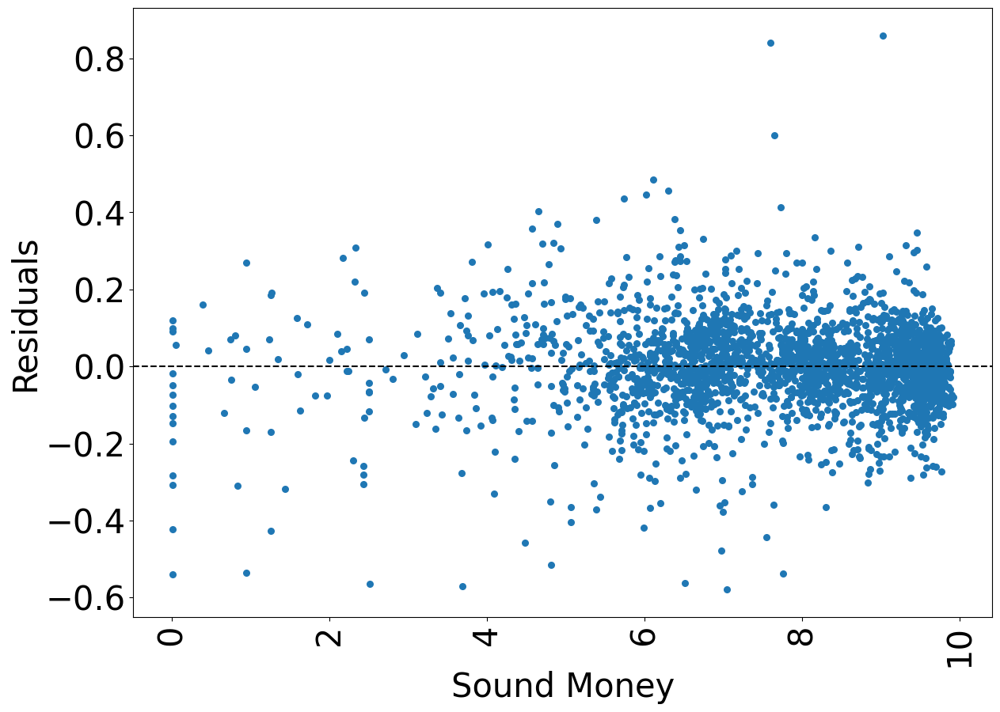

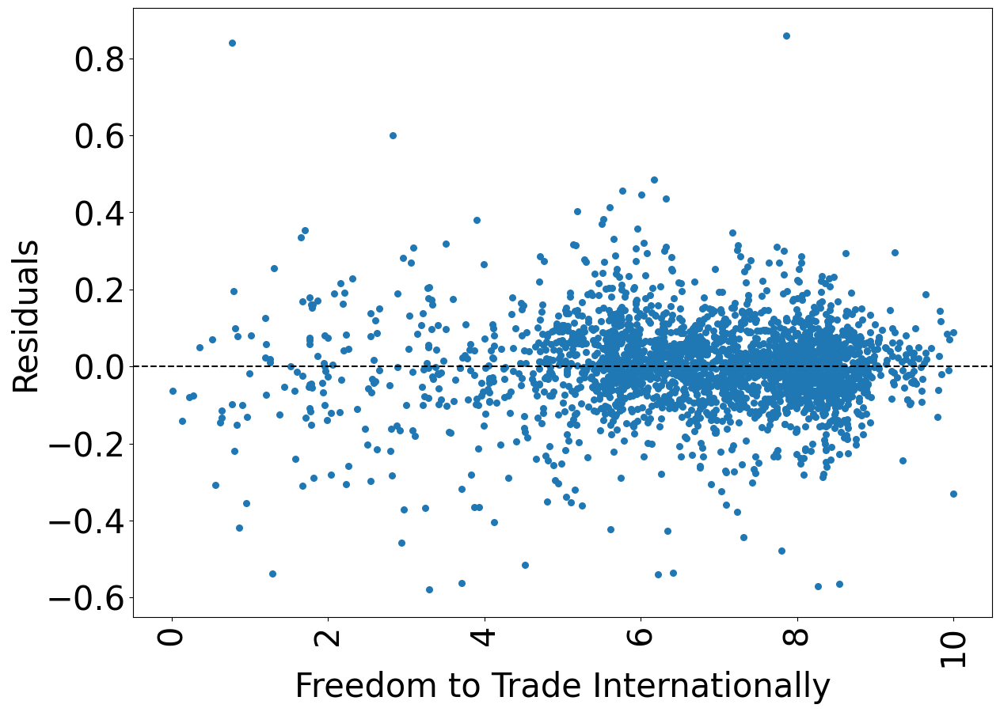

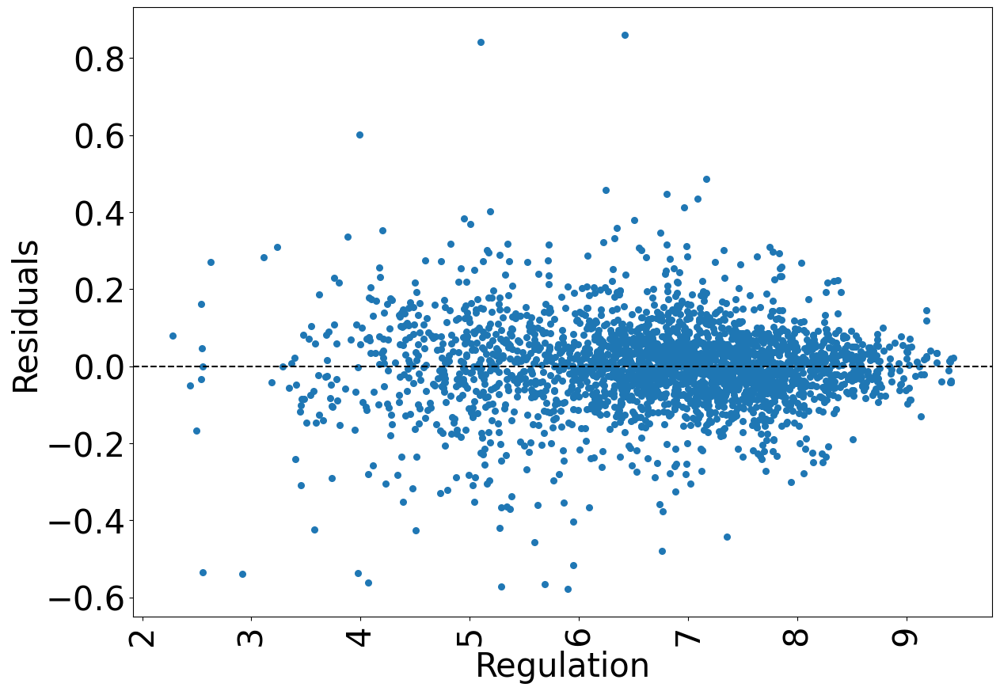

Entity: True
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0496
Estimator:                   PanelOLS   R-squared (Between):              0.0416
No. Observations:                2606   R-squared (Within):               0.0496
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0342
Time:                        02:27:49   Log-likelihood                    1712.5
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      25.568
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(5,2448)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             6.5877
   

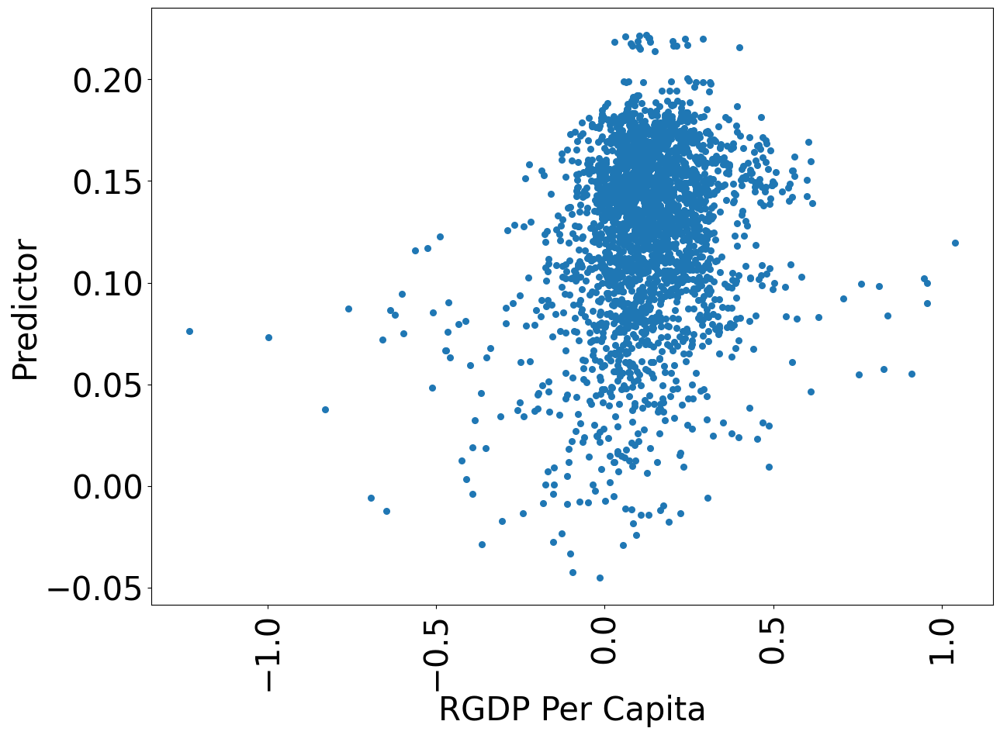

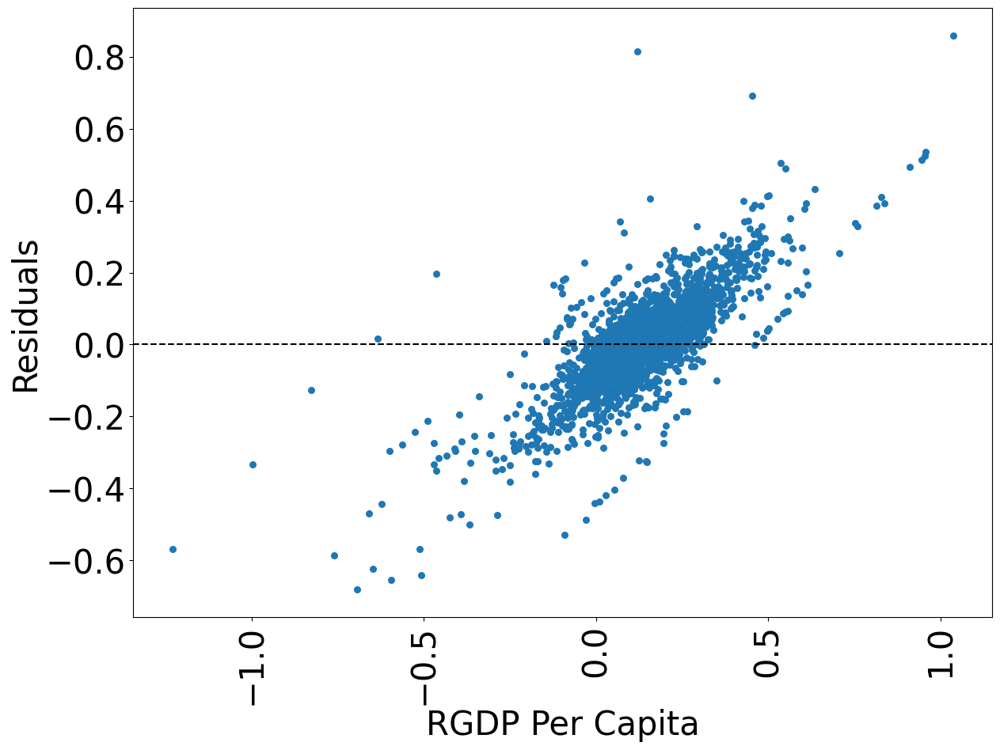

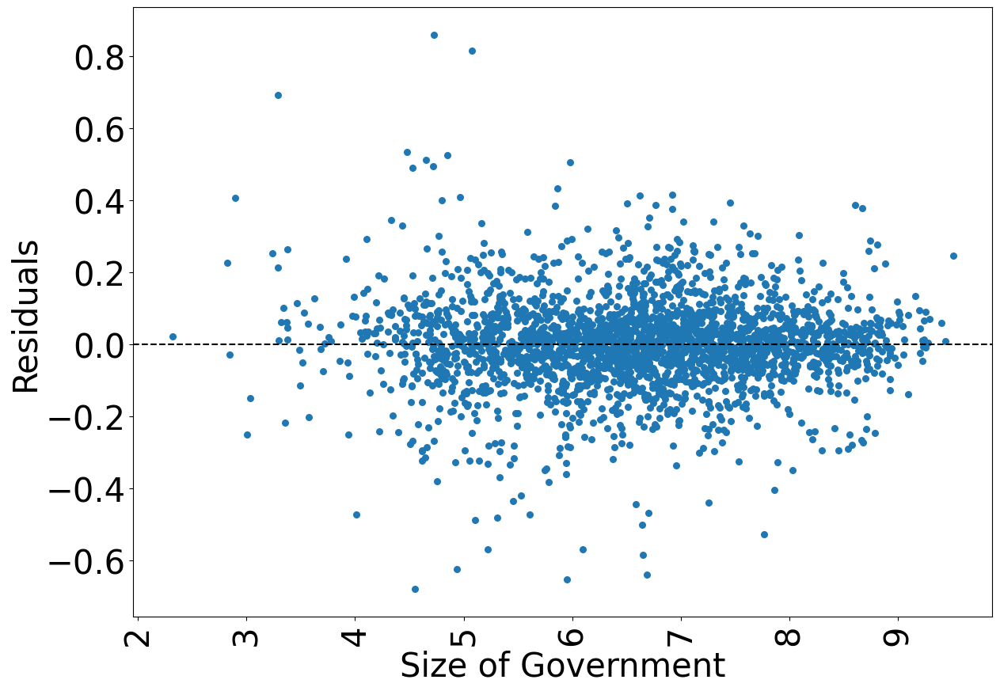

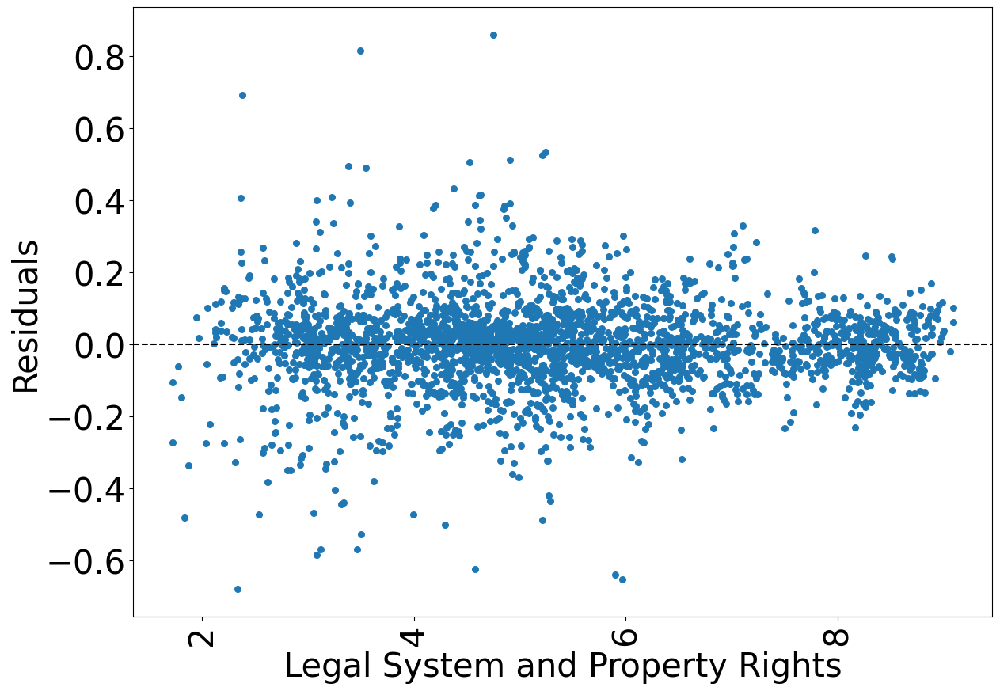

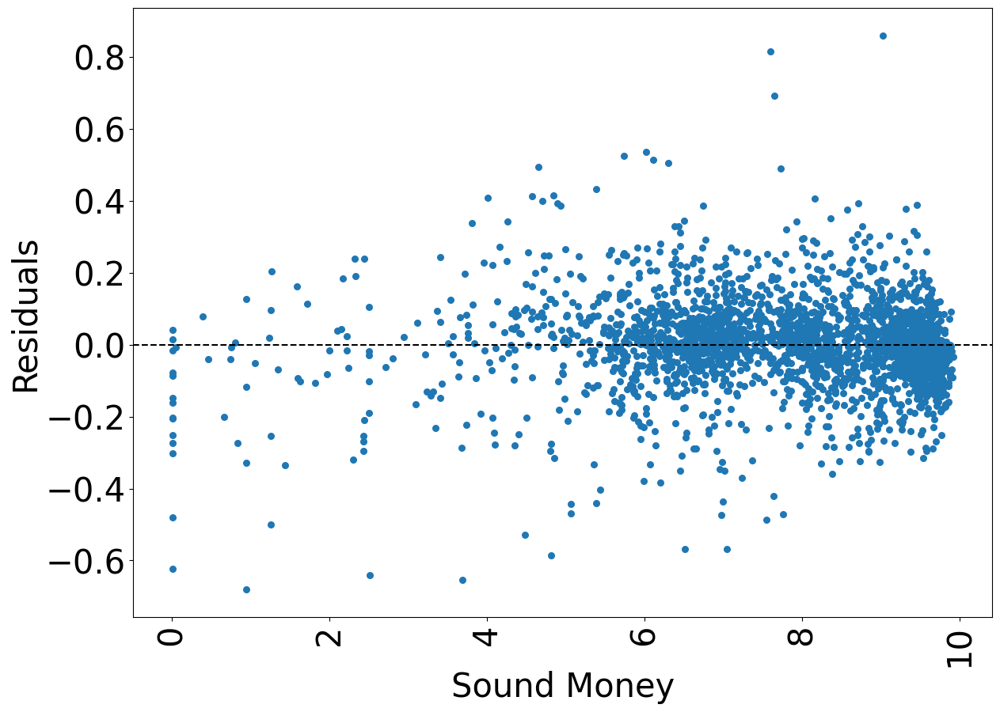

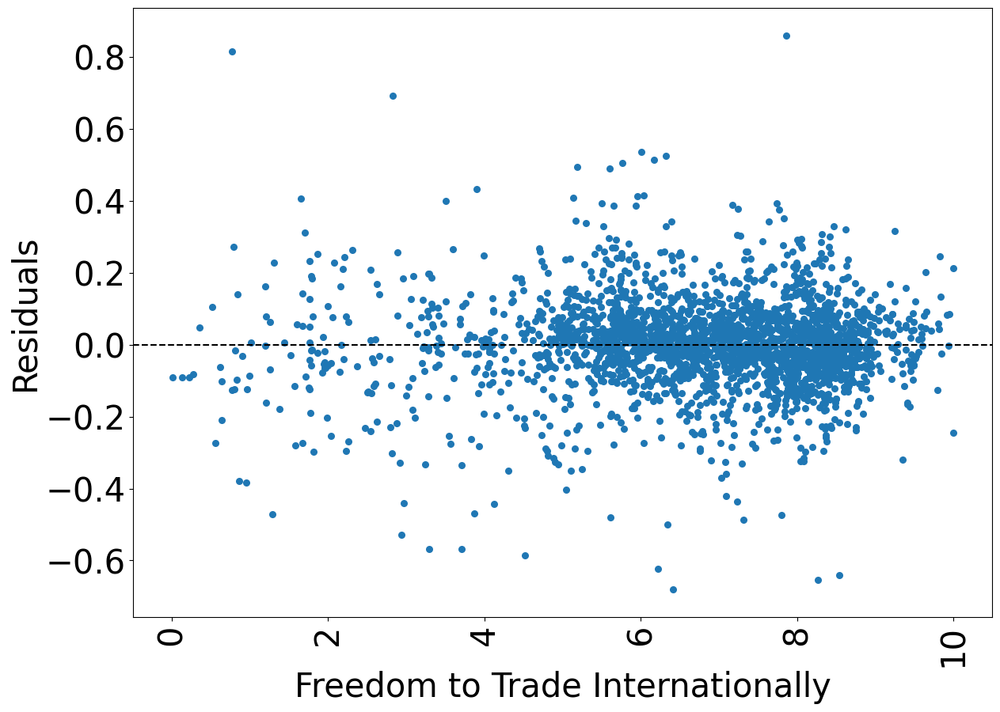

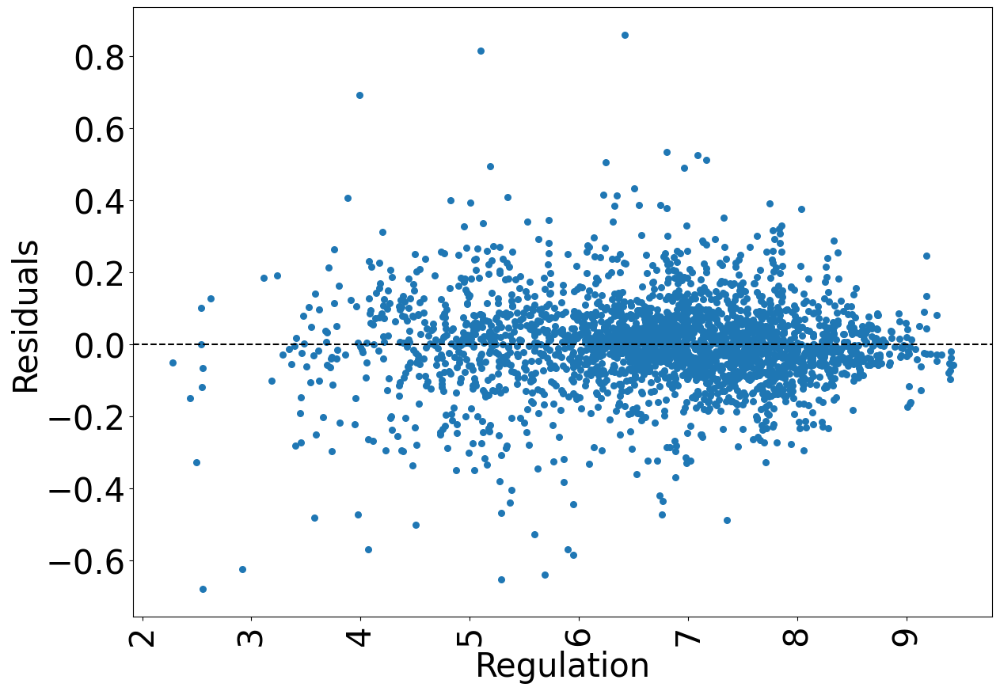

Entity: False
Time: True
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0434
Estimator:                   PanelOLS   R-squared (Between):              0.0539
No. Observations:                2606   R-squared (Within):               0.0466
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0452
Time:                        02:27:58   Log-likelihood                    1245.3
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      23.415
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(5,2581)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             4.7977
   

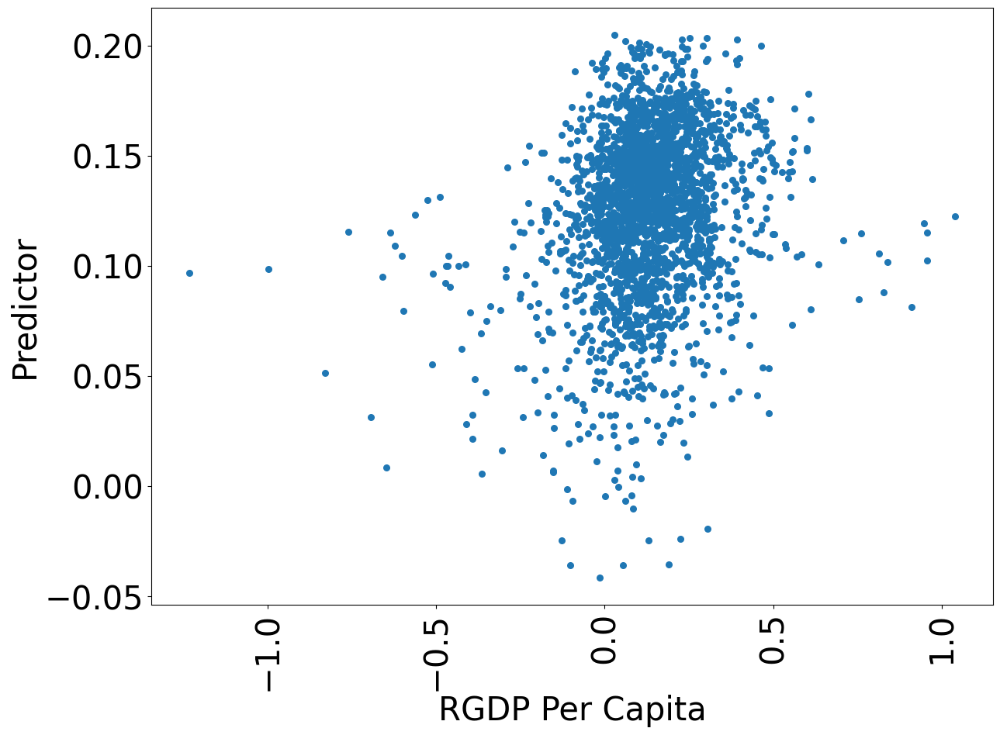

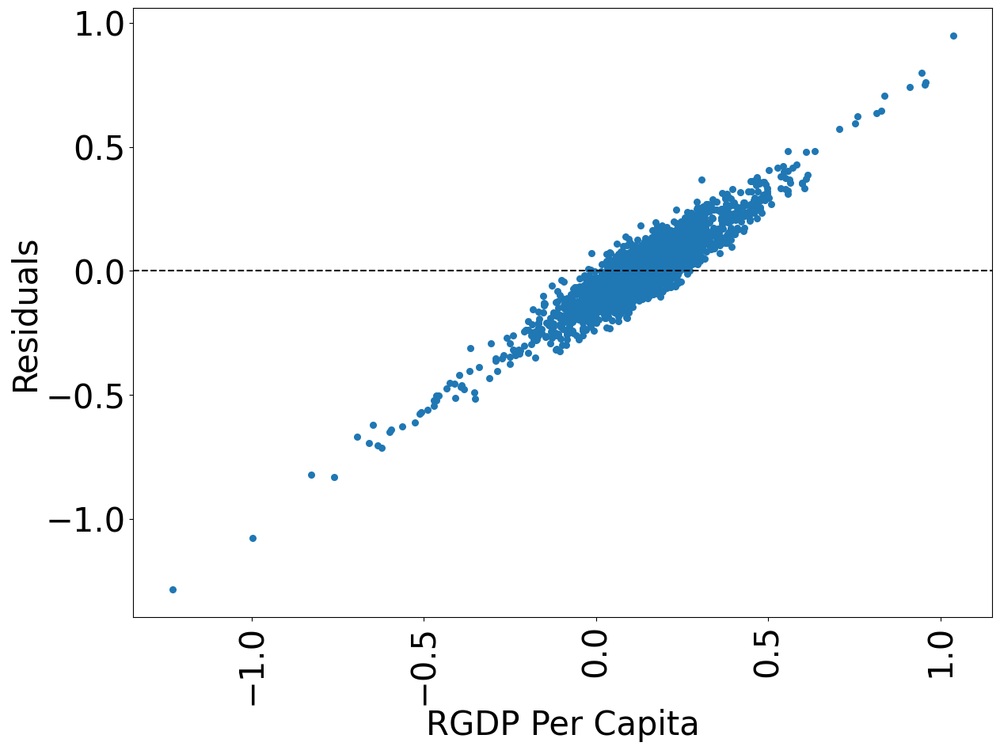

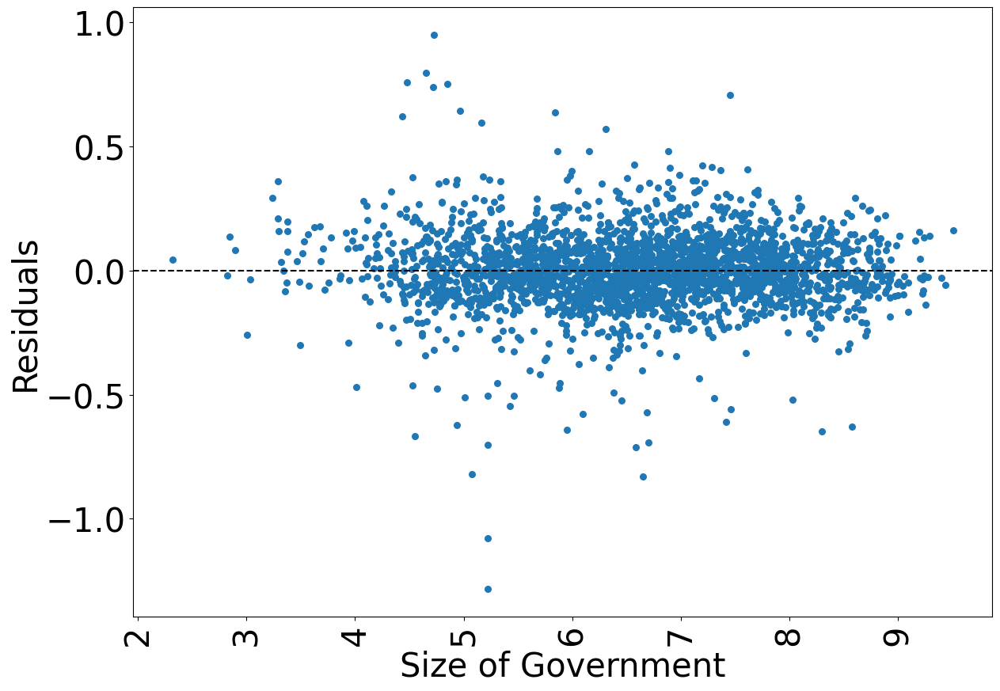

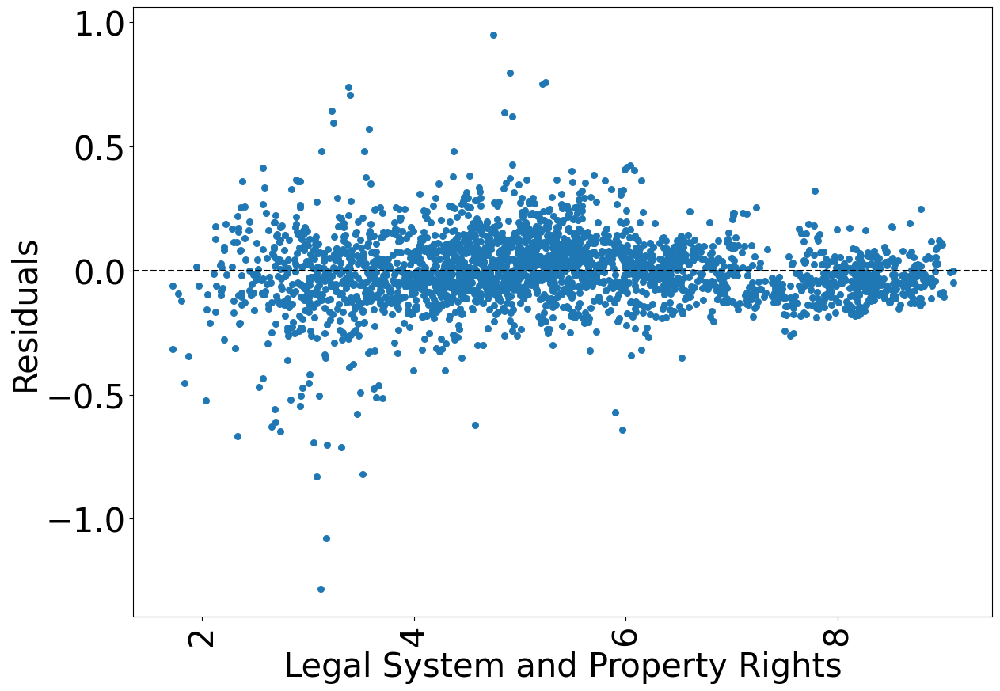

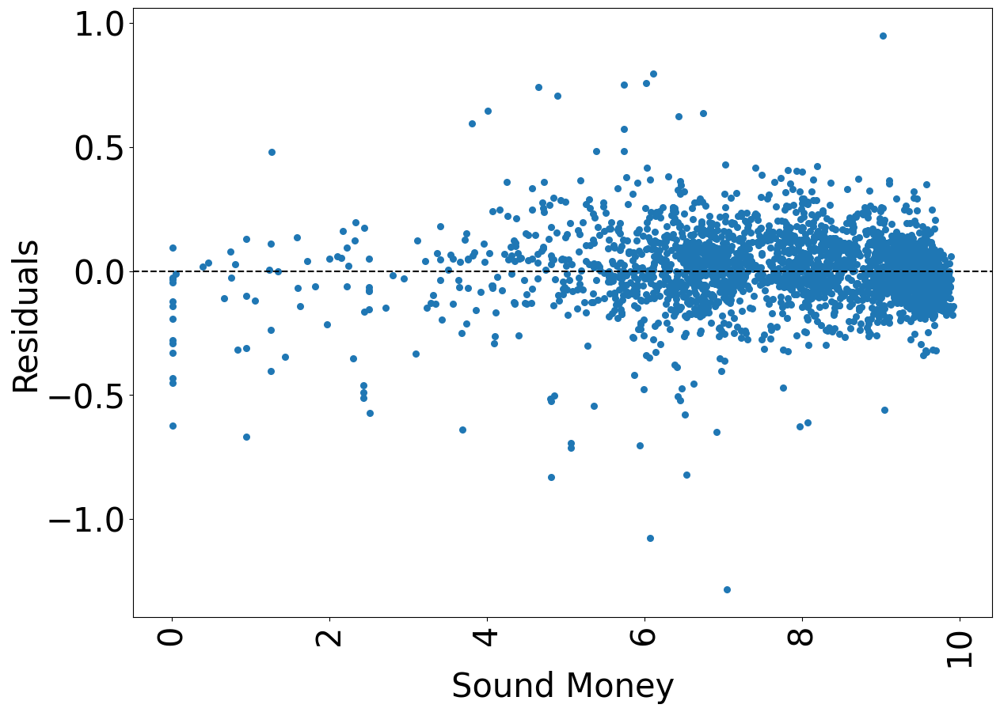

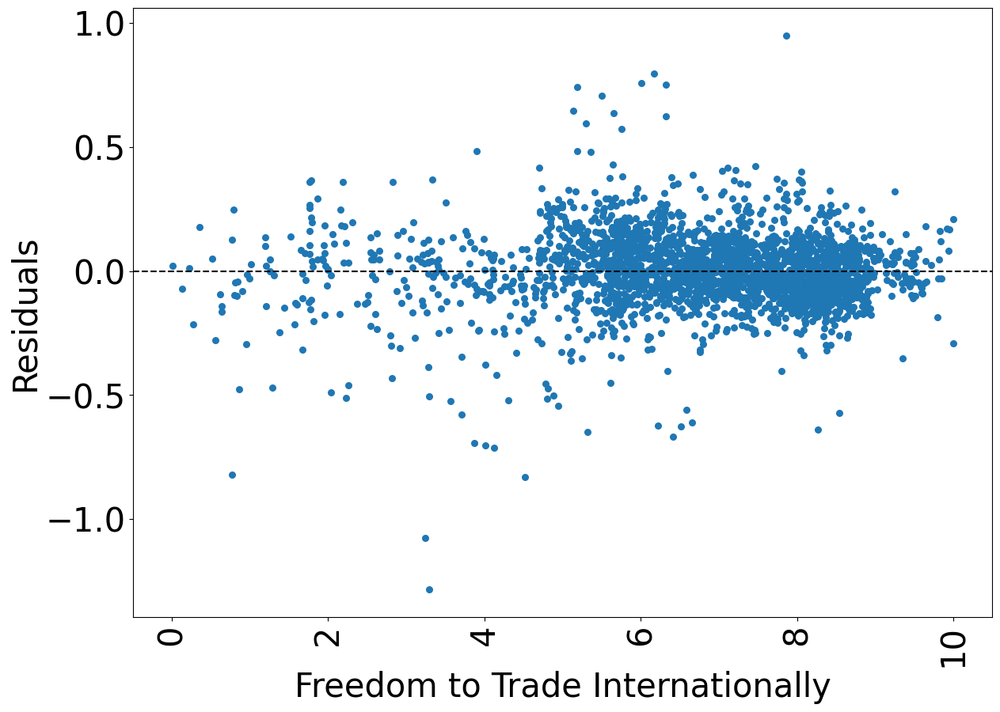

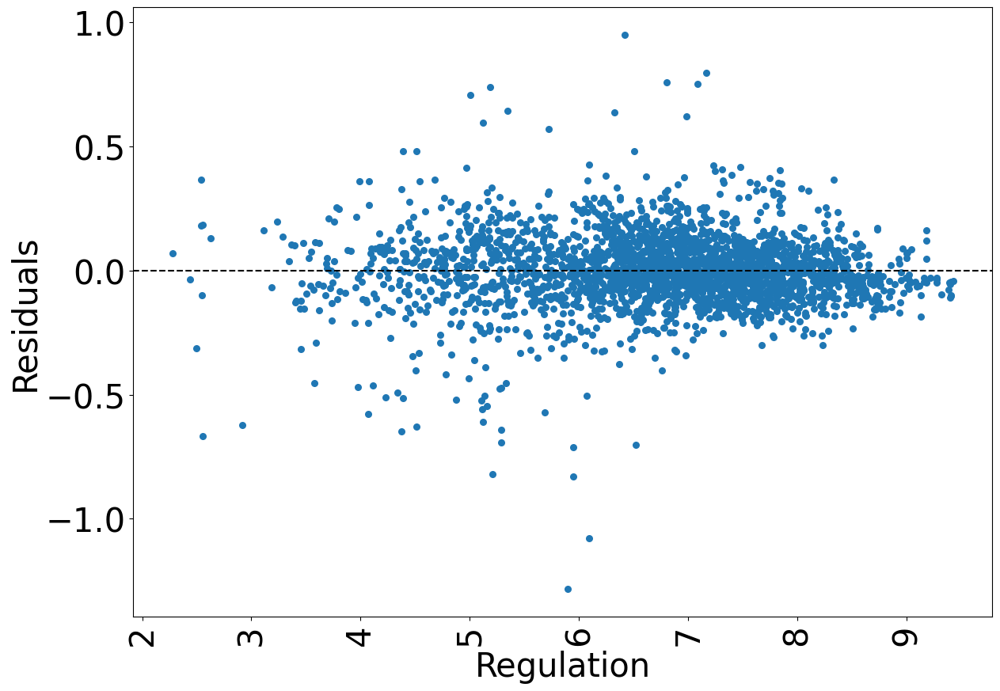

Entity: False
Time: False
                          PanelOLS Estimation Summary                           
Dep. Variable:        RGDP Per Capita   R-squared:                        0.0465
Estimator:                   PanelOLS   R-squared (Between):              0.0639
No. Observations:                2606   R-squared (Within):               0.0439
Date:                Thu, Apr 27 2023   R-squared (Overall):              0.0465
Time:                        02:28:13   Log-likelihood                    1105.2
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      25.341
Entities:                         165   P-value                           0.0000
Avg Obs:                       15.794   Distribution:                  F(5,2600)
Min Obs:                       0.0000                                           
Max Obs:                       20.000   F-statistic (robust):             6.6096
  

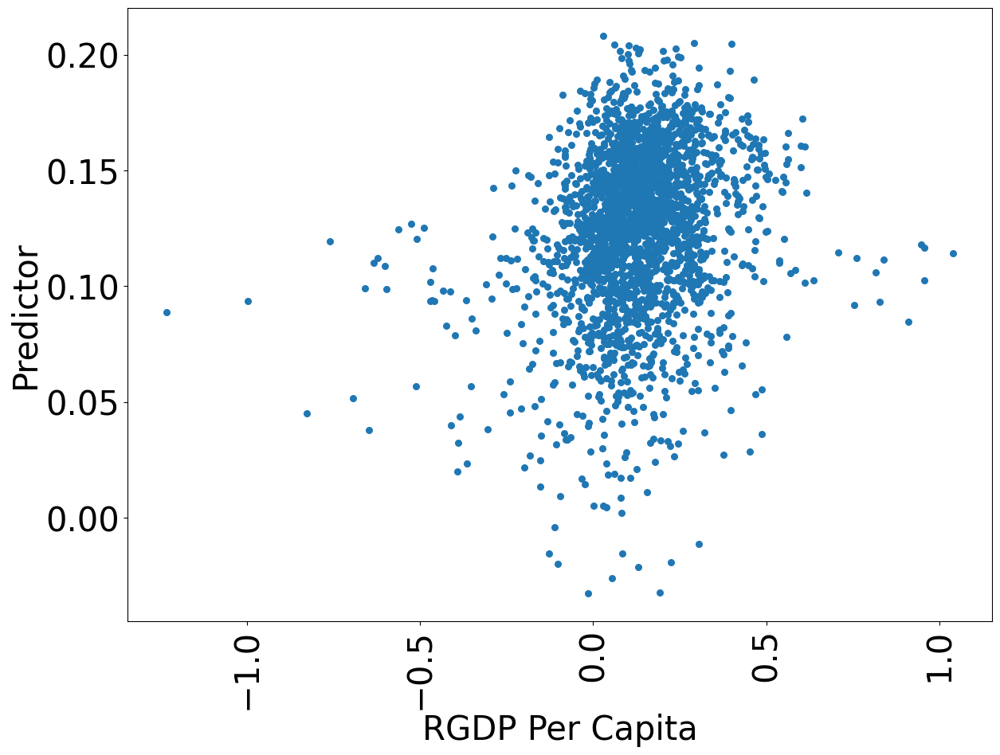

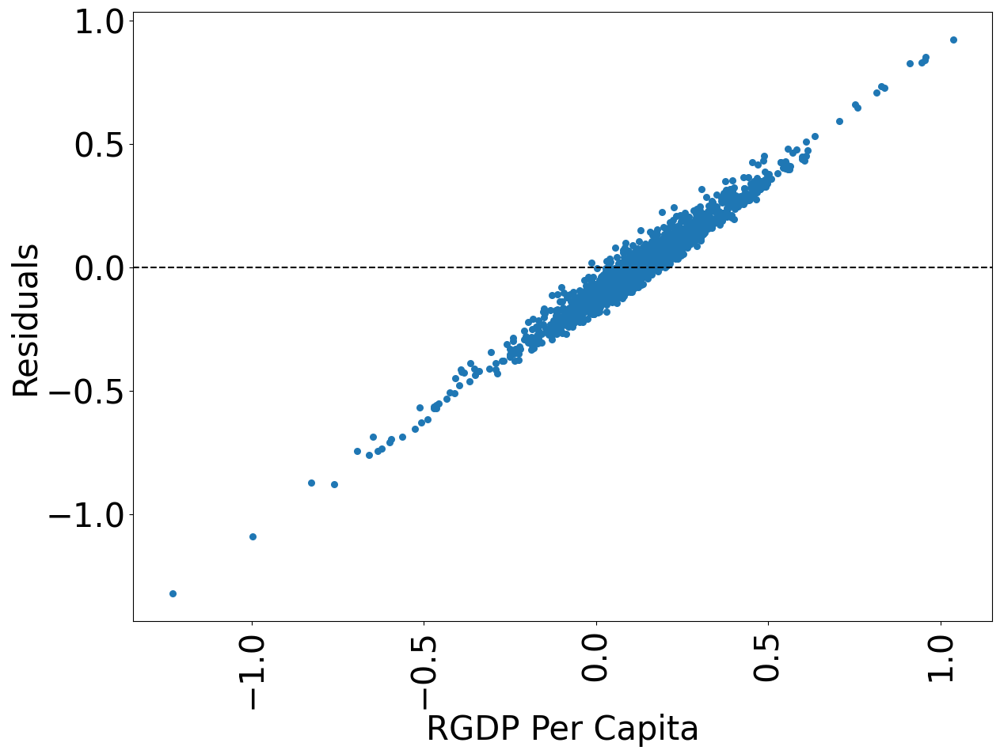

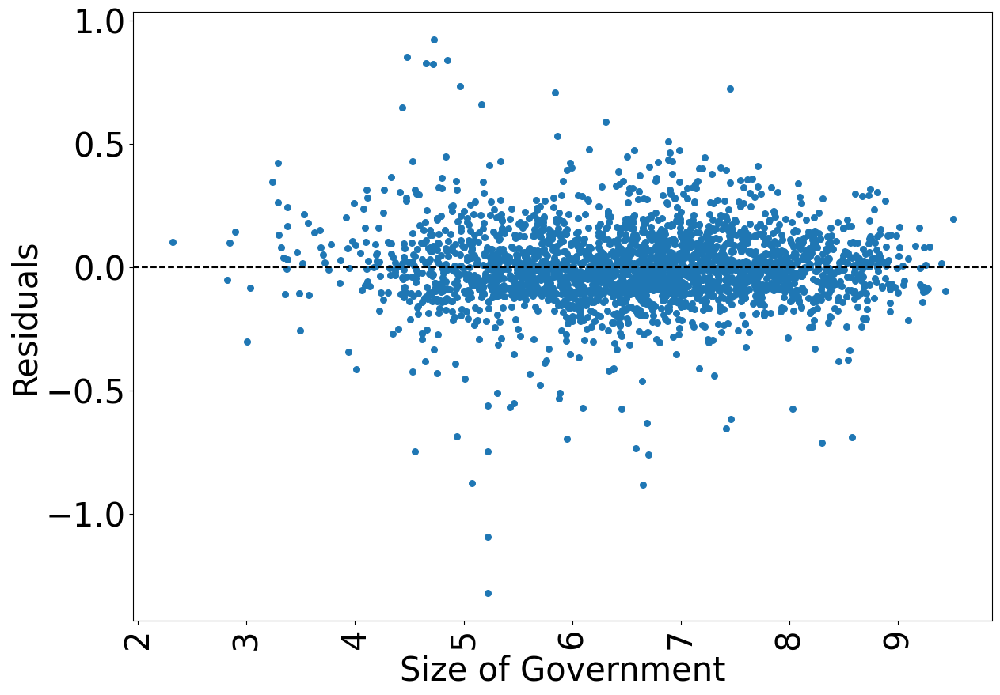

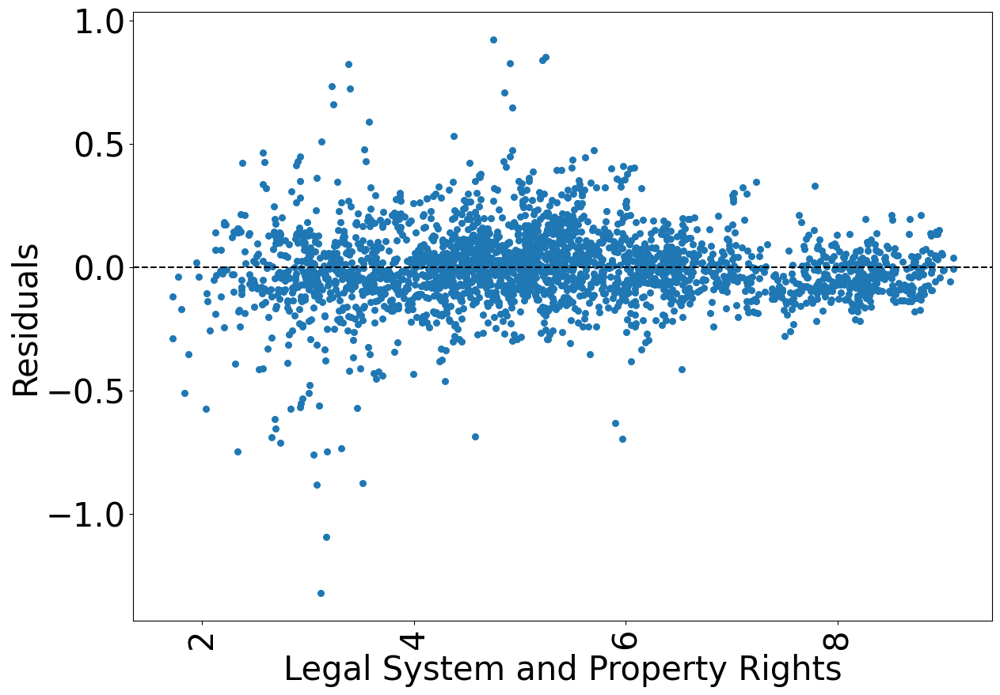

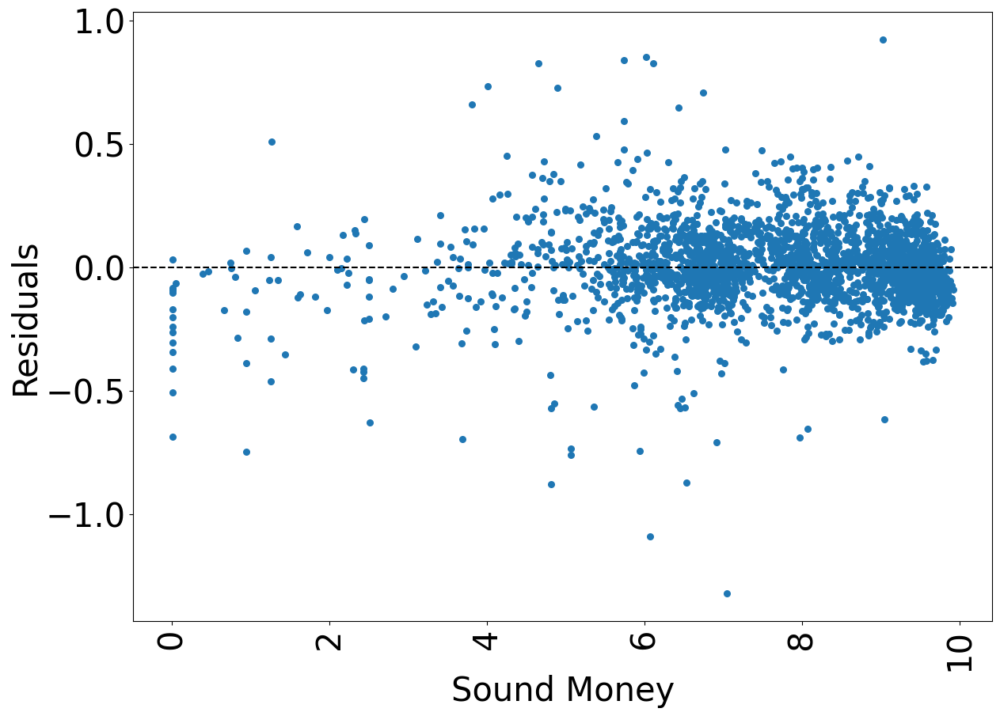

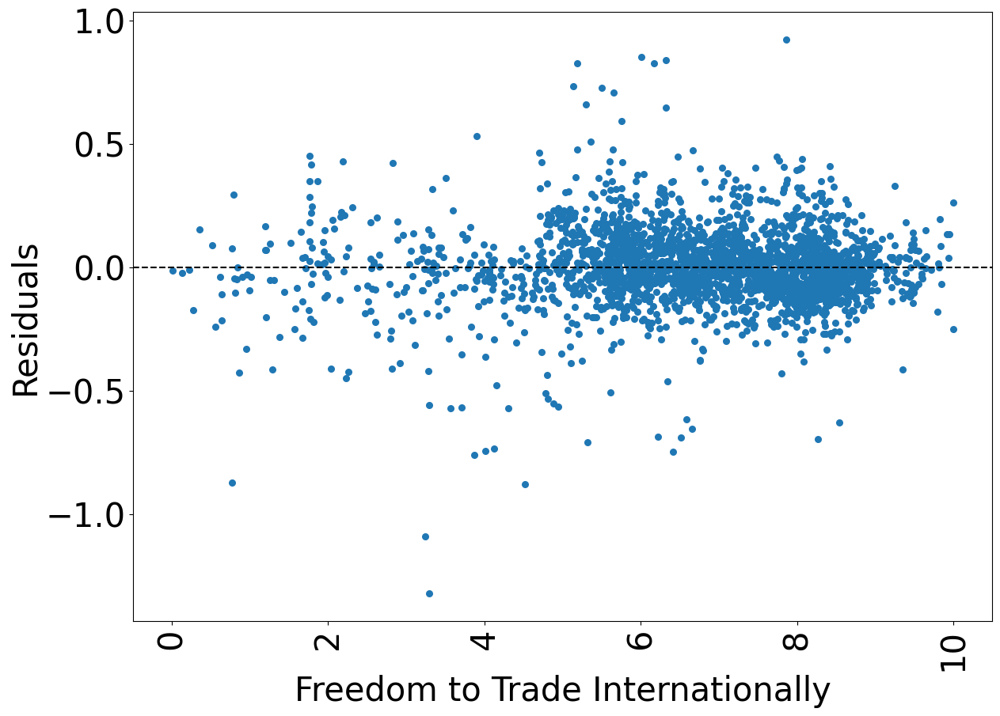

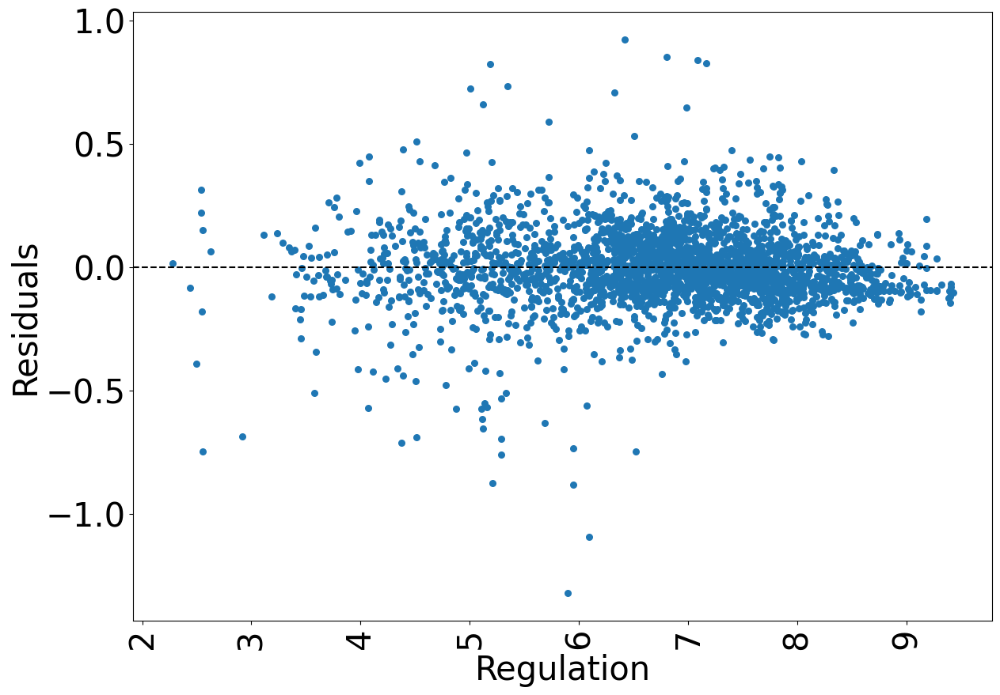

In [22]:
# select independent variables
X_names = list(data.keys())[2:7]
# select dependent variable
y_name = ['RGDP Per Capita'] 

# loop through entity and time options for panel regression
for entity in [True, False]:
    for time in [True, False]:
        # remove missing values from data
        reg_data = data.dropna()
        # run panel regression
        results = panel_regress(reg_data, X_names, 
                      y_name,
                      constant = True,
                     entity = entity,
                     time = time)
        # print entity and time settings and regression results
        print('Entity: ' + str(entity) + '\nTime: ' + str(time))
        print(results)
        # add predictor and residual columns to data based on regression results
        reg_data['Predictor'] = results.predict()
        reg_data['Residuals'] = results.resids
        # plot residuals for each independent variable and dependent variable
        plot_residuals(reg_data, y_name, X_names)